## GAN

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [9]:
def get_generator_block(input_dim,output_dim):
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True)
    )

In [10]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            nn.Linear(hidden_dim*8,im_dim),
            nn.Sigmoid()
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [11]:
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples,z_dim).to(device)

In [12]:
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        nn.Linear(input_dim,output_dim),
        nn.LeakyReLU(0.2)
    )

In [13]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim,1)
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [18]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 100
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('./mnist_data', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

### DO NOT EDIT ###
device = 'cuda'

In [19]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [20]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    z = torch.randn(num_images,z_dim).to(device)
    z = gen(z)
    pred_fake = disc(z.detach())
    pred_real = disc(real)
    real_loss = criterion(pred_real,torch.ones_like(pred_real))
    fake_loss = criterion(pred_fake,torch.zeros_like(pred_fake))
    disc_loss = (real_loss + fake_loss)/2
    return disc_loss

In [21]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    z = torch.randn(num_images,z_dim).to(device)
    z = gen(z)
    pred_fake = disc(z)
    gen_loss = criterion(pred_fake,torch.ones_like(pred_fake))
    return gen_loss

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 1.3765305258035652, discriminator loss: 0.418349672019482


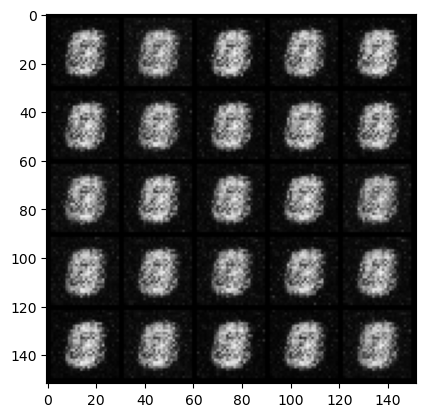

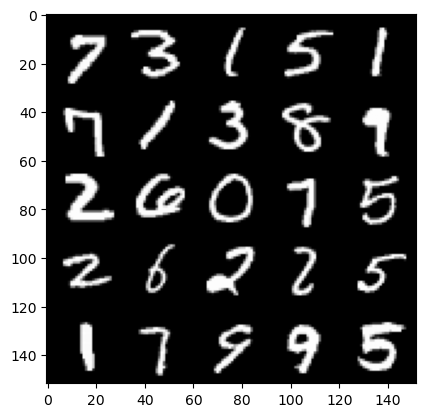

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 1.7132898430824284, discriminator loss: 0.28562462472915673


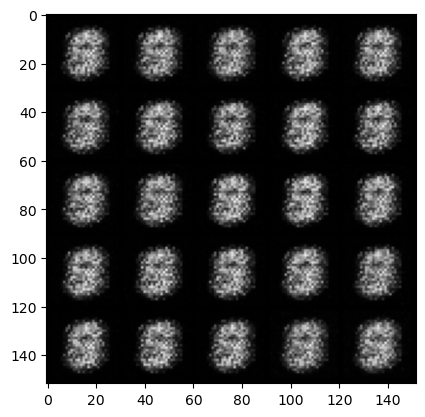

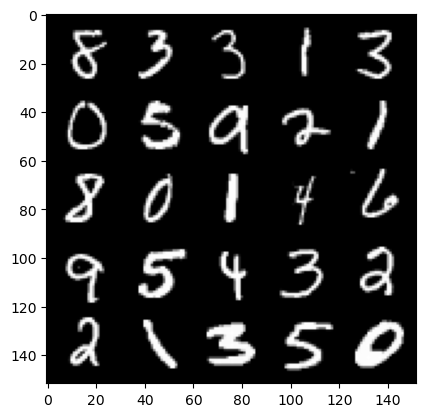

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 1.974013720750808, discriminator loss: 0.17387328466773047


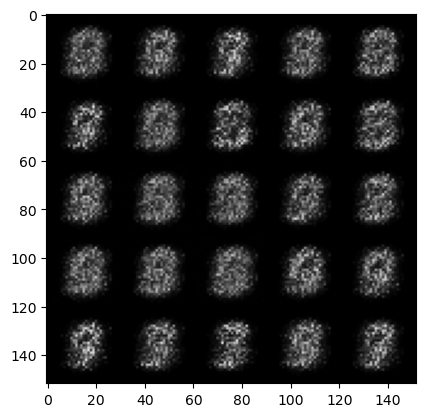

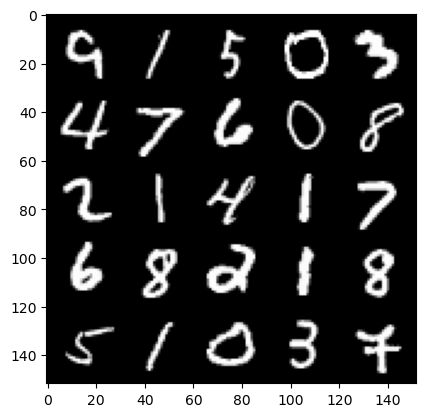

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 1.673123811006547, discriminator loss: 0.22091130778193457


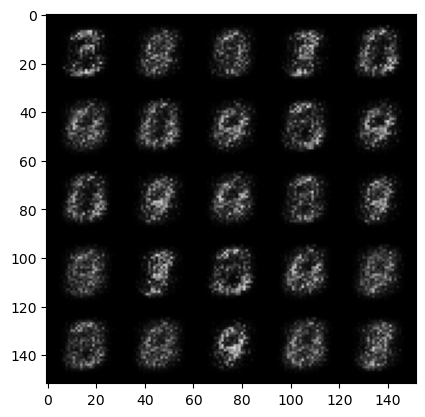

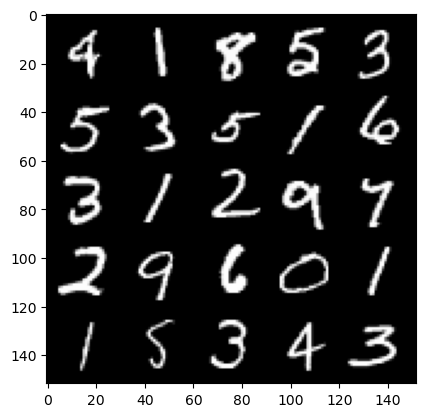

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 1.6220263791084268, discriminator loss: 0.2283320025503636


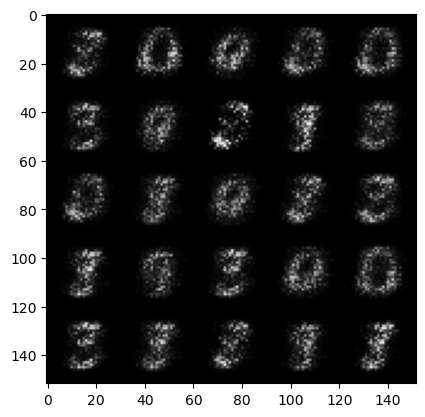

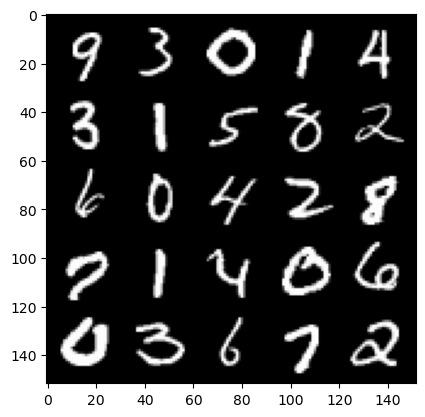

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 1.9588772799968723, discriminator loss: 0.16517652486264722


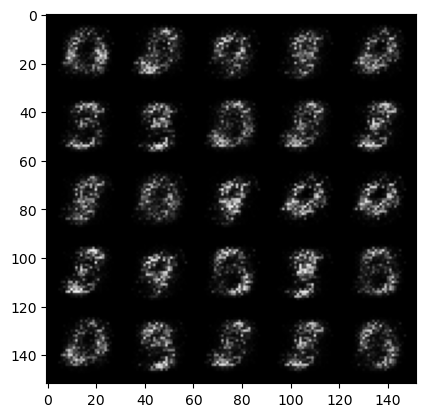

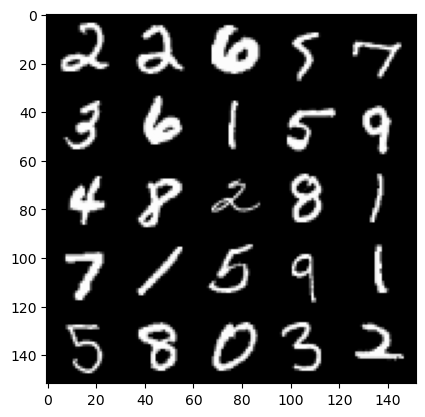

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 2.427155998229981, discriminator loss: 0.12107491257786747


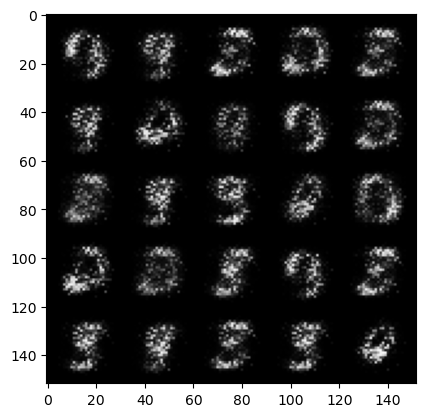

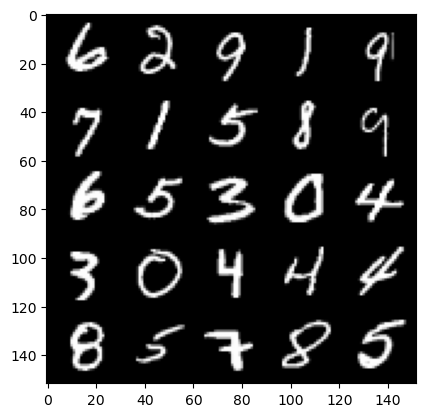

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 2.861877433776852, discriminator loss: 0.0974931429624557


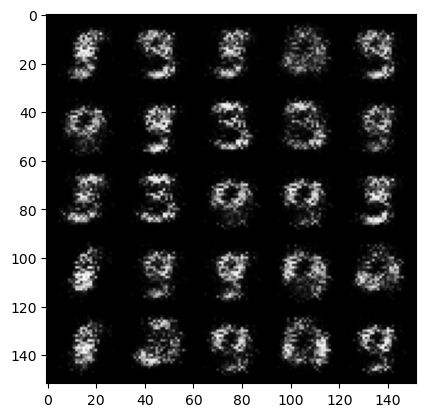

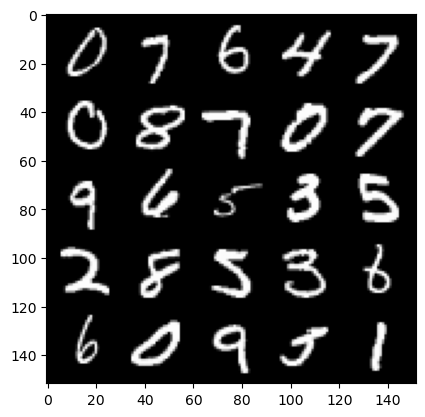

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 3.1399473748207107, discriminator loss: 0.08798441382497553


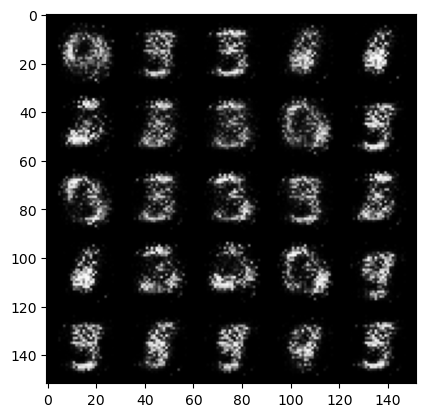

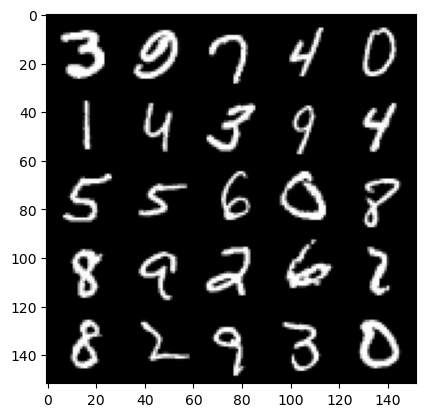

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 3.4339978938102727, discriminator loss: 0.07290334613621226


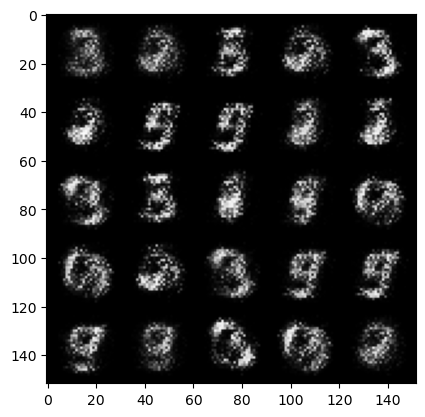

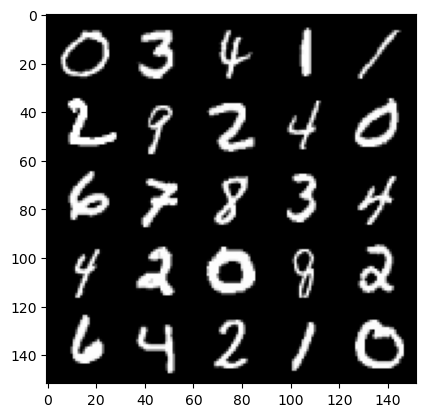

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 3.5720545849800107, discriminator loss: 0.07067988962680097


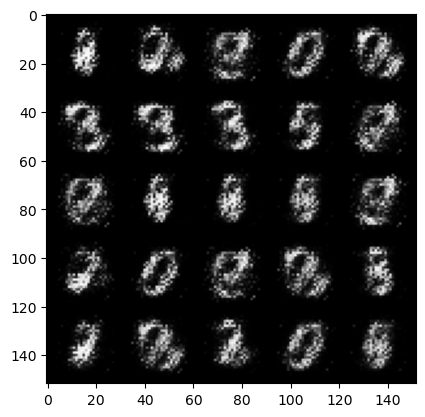

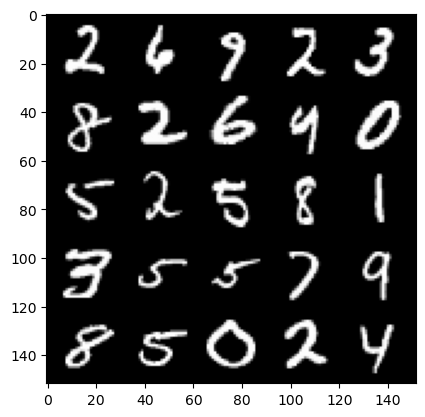

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 3.5555947036743167, discriminator loss: 0.0711963769495488


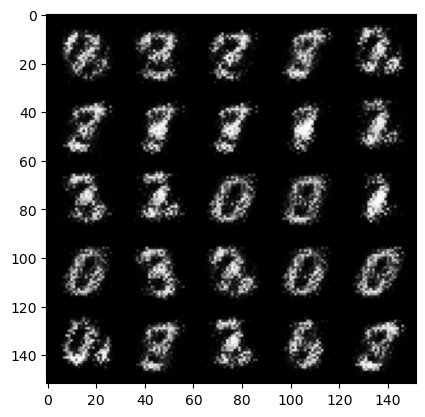

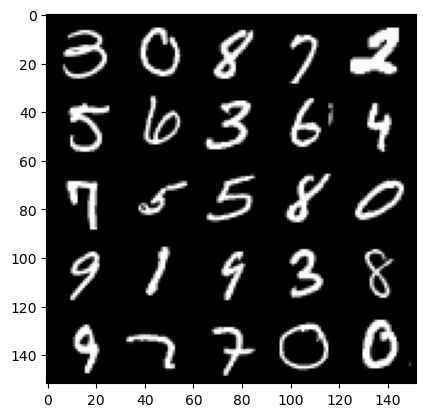

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 4.098717891216279, discriminator loss: 0.0539984903149307


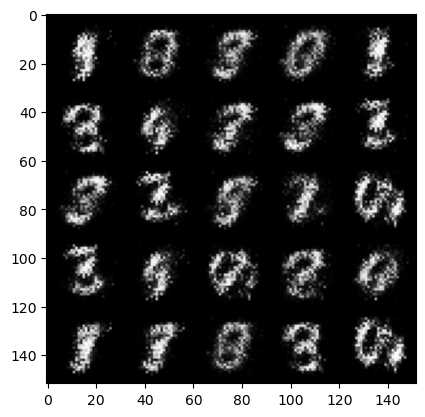

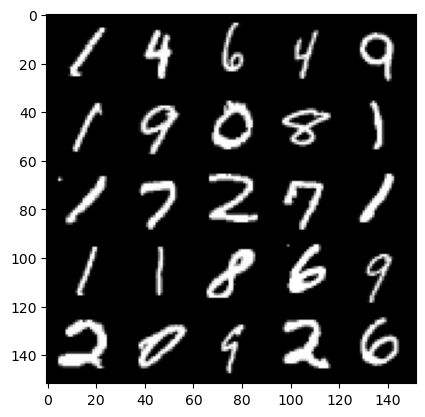

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 4.150418419837943, discriminator loss: 0.05779849500209092


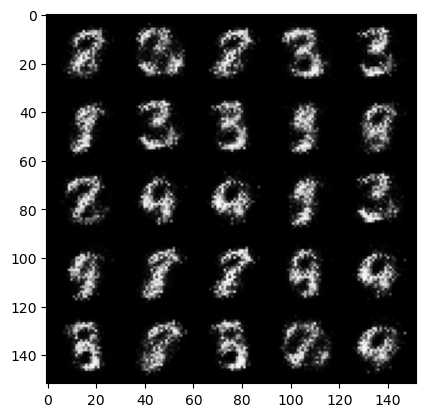

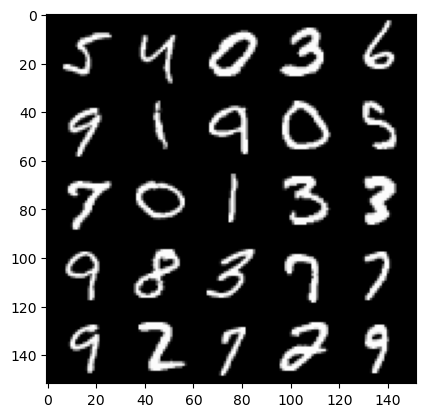

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 3.869905465602876, discriminator loss: 0.05086553159356119


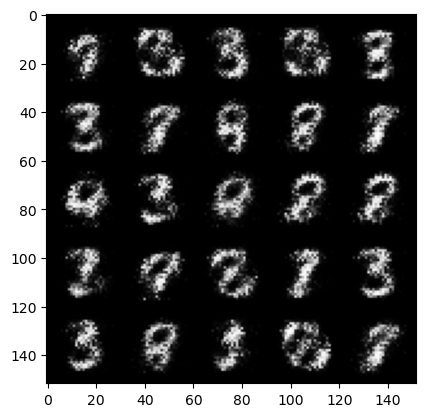

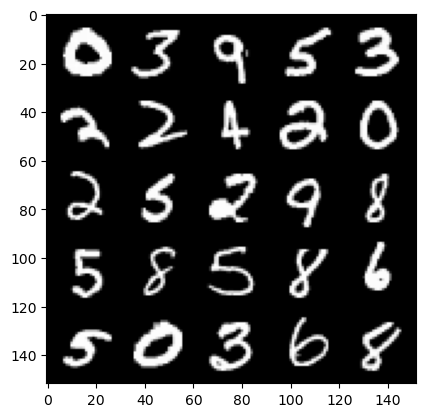

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 4.1797079582214325, discriminator loss: 0.046956018414348356


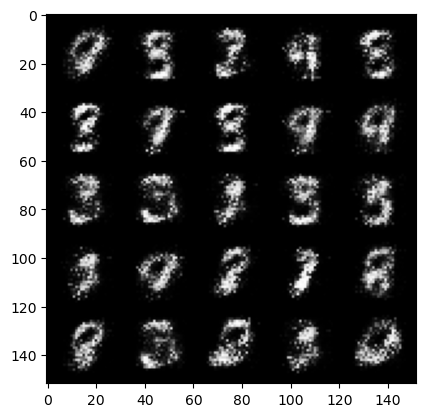

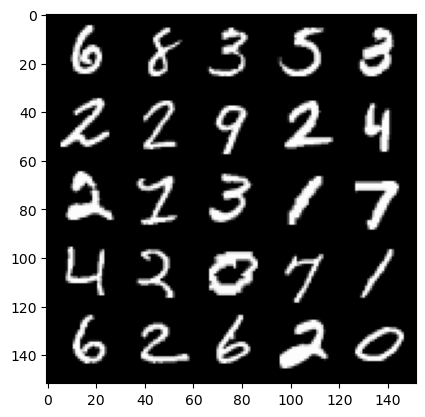

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 3.967428095340727, discriminator loss: 0.06179862690344454


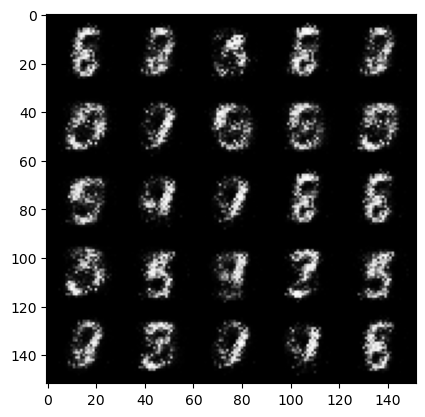

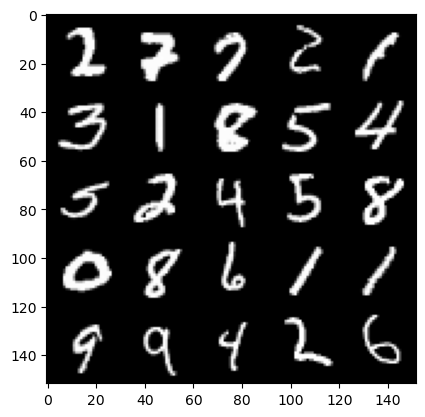

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 4.127865576267243, discriminator loss: 0.061123251110315364


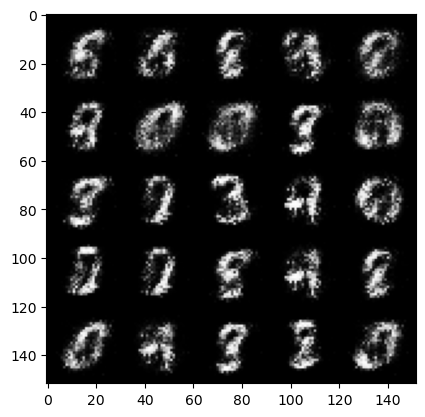

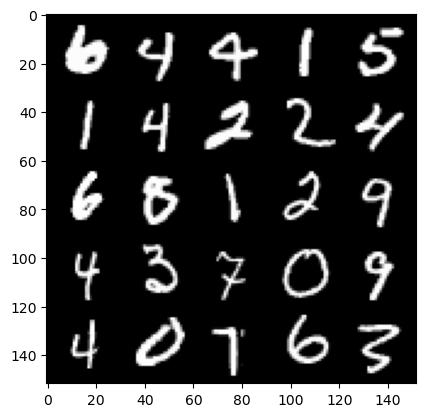

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 4.021016853332519, discriminator loss: 0.06152949333935973


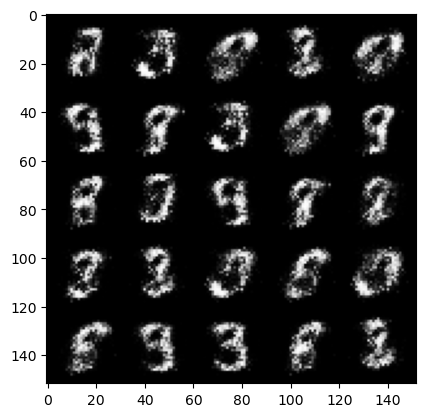

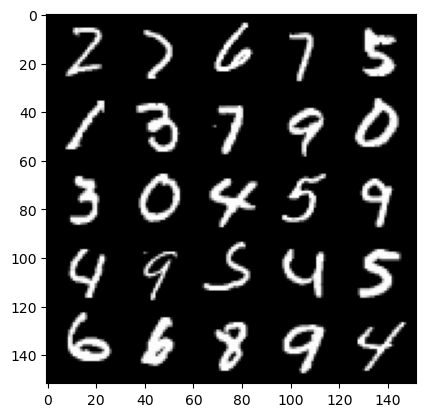

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 4.165655502319338, discriminator loss: 0.06265501172095535


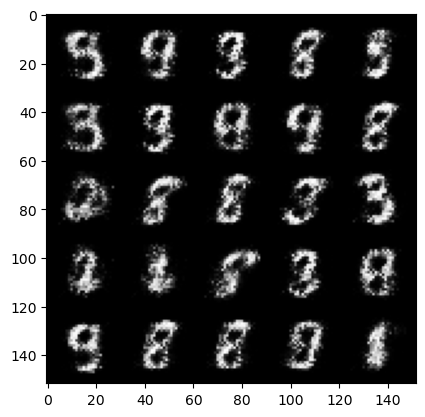

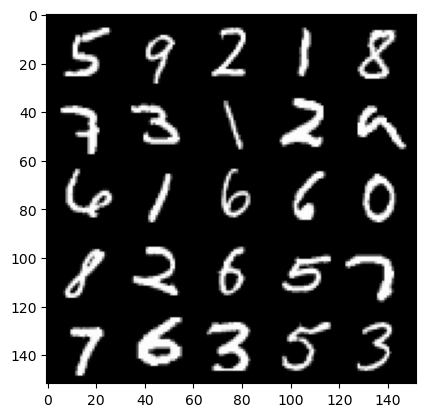

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 4.010058676719666, discriminator loss: 0.05984758305922145


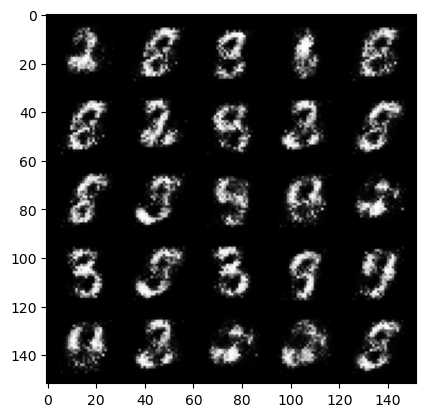

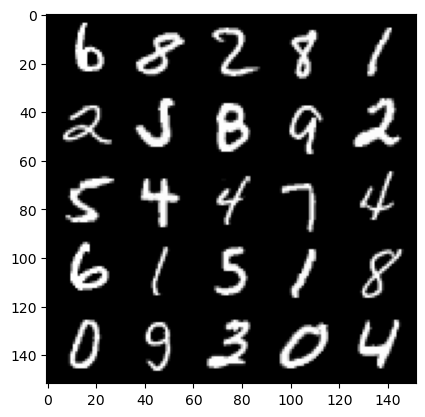

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 3.9207972297668463, discriminator loss: 0.07082442000508306


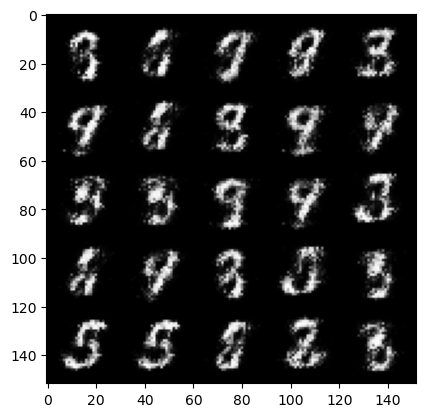

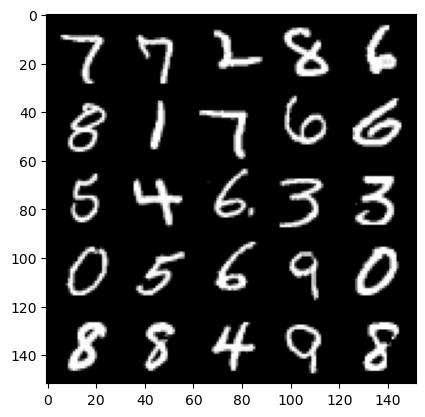

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 3.9753043289184555, discriminator loss: 0.06575556953623894


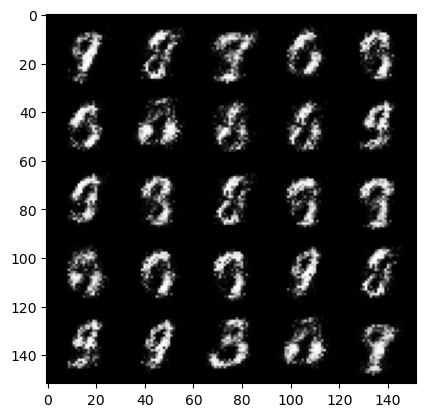

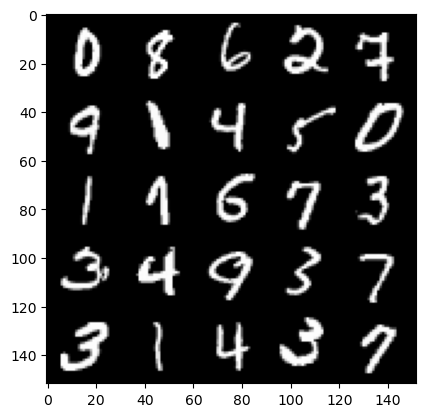

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 3.8281151976585357, discriminator loss: 0.07838390583544977


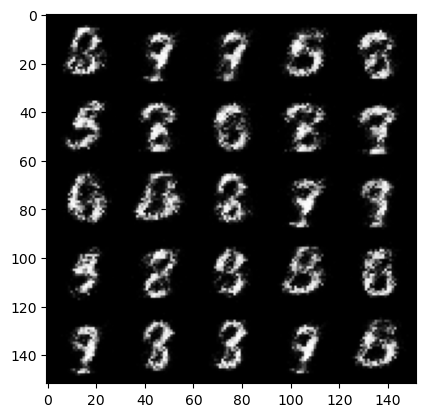

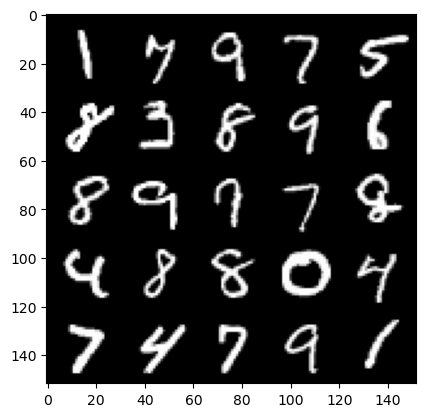

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 3.8879154214859013, discriminator loss: 0.07939029632508761


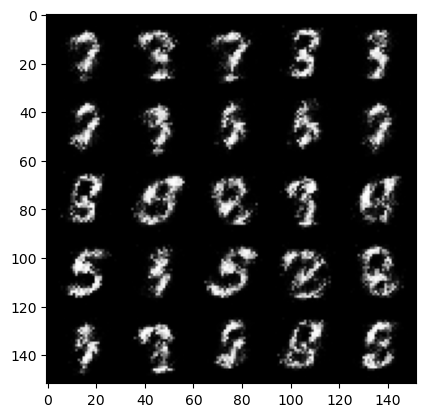

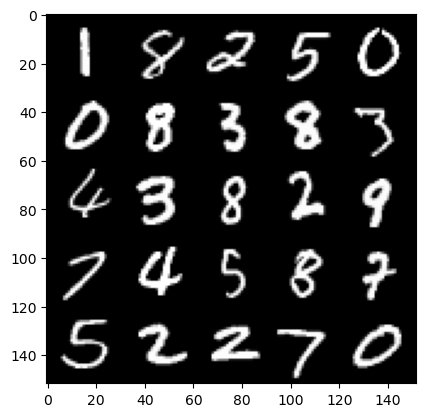

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 3.8625828657150274, discriminator loss: 0.09411223503947257


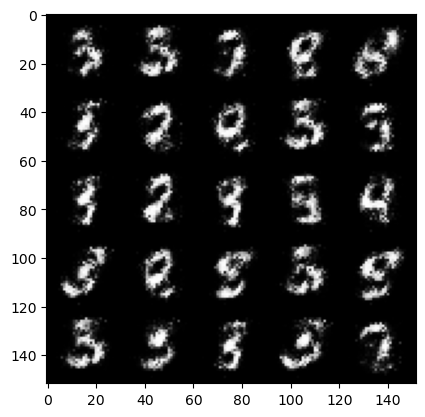

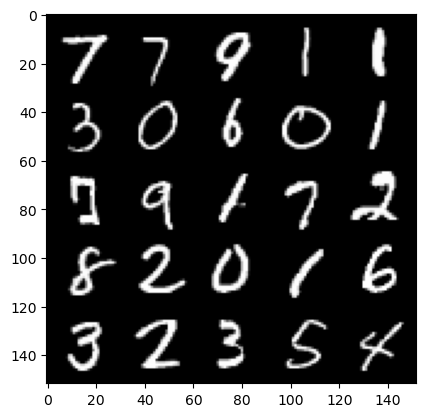

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 3.94274134206772, discriminator loss: 0.07165507869049911


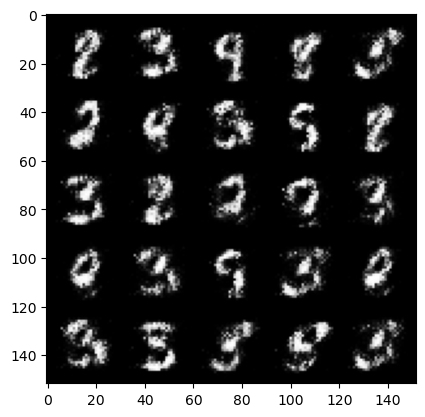

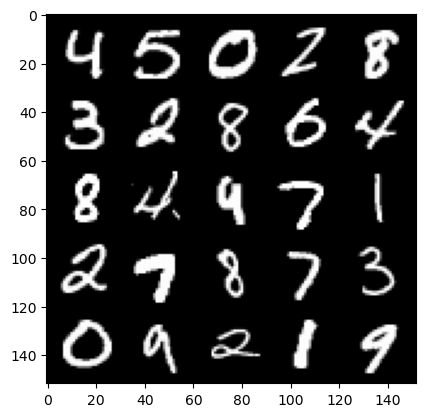

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 3.805367655277252, discriminator loss: 0.09173071722686285


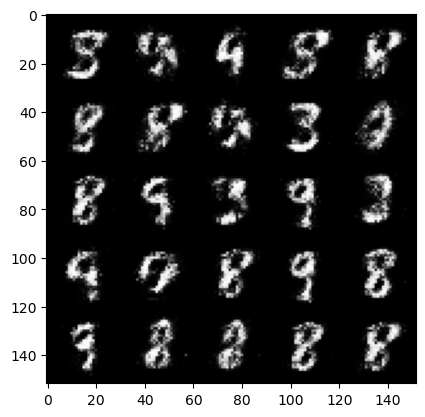

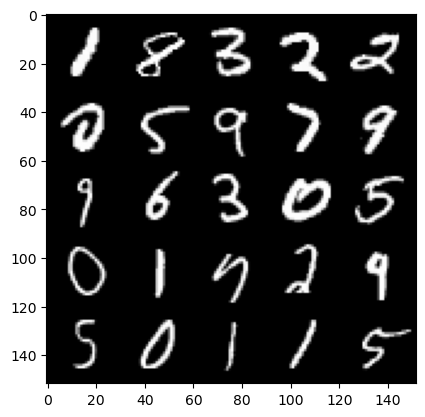

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 3.6173466892242416, discriminator loss: 0.11063401560485363


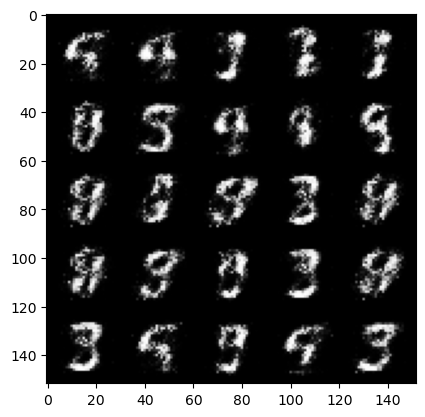

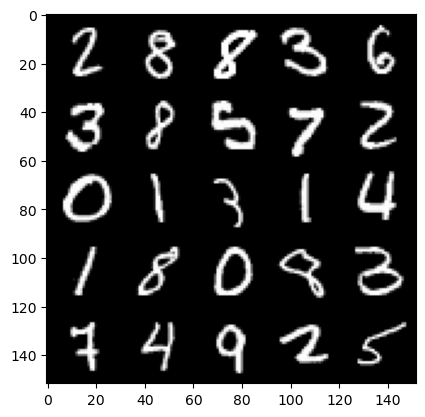

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 3.624719663143159, discriminator loss: 0.1167080987468362


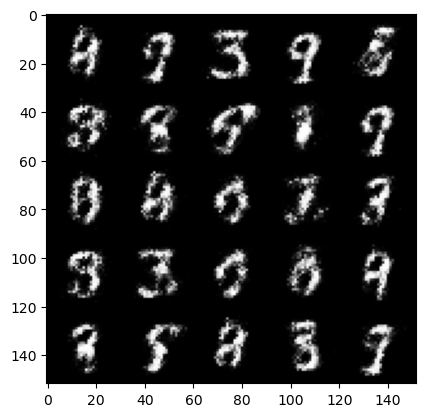

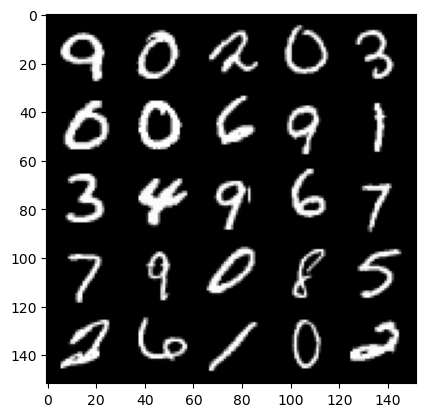

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 3.586133269309995, discriminator loss: 0.10325225088000296


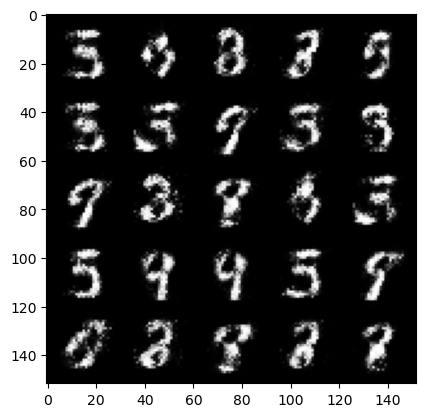

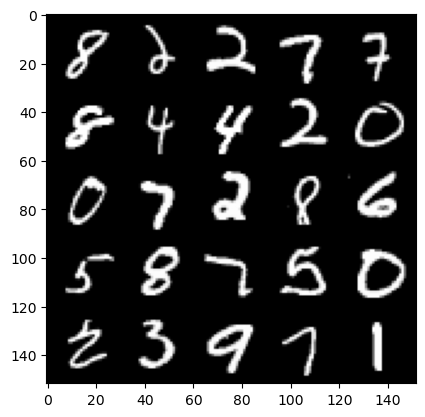

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 3.7825210895538333, discriminator loss: 0.08972763921320451


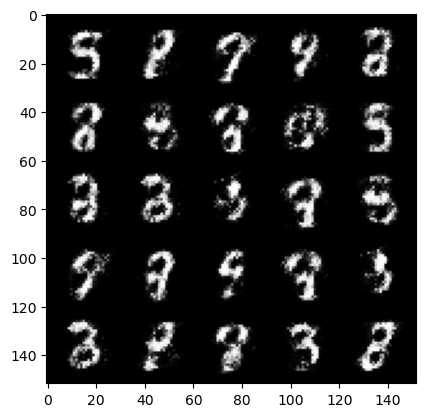

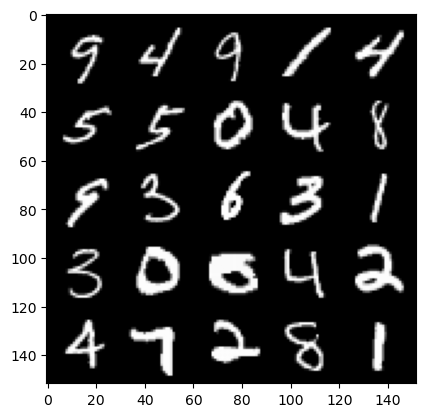

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 3.6797854113578743, discriminator loss: 0.11818906924128549


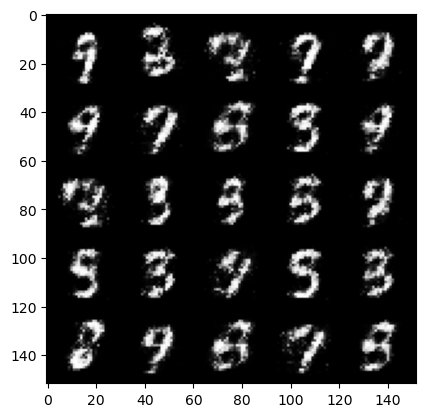

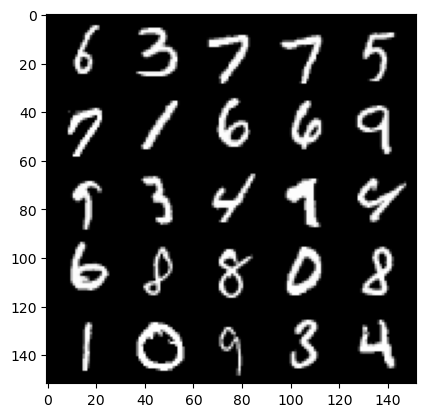

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 3.475174734592441, discriminator loss: 0.12900809429585935


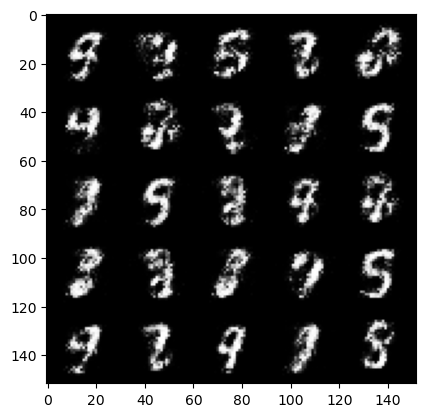

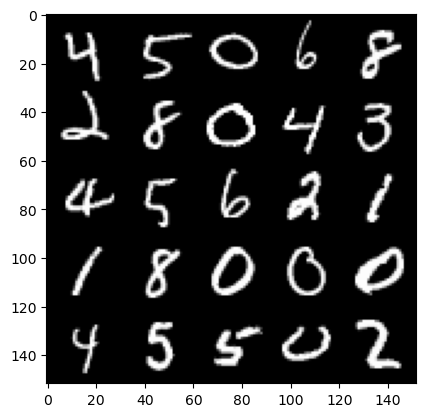

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 3.552913845539094, discriminator loss: 0.12921966714411975


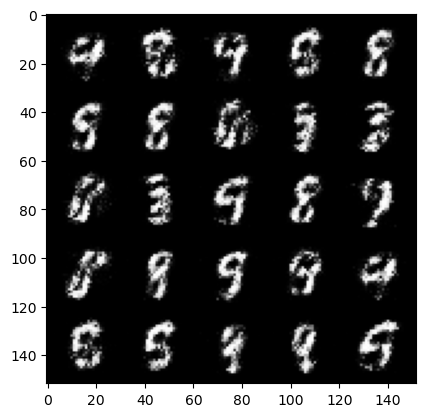

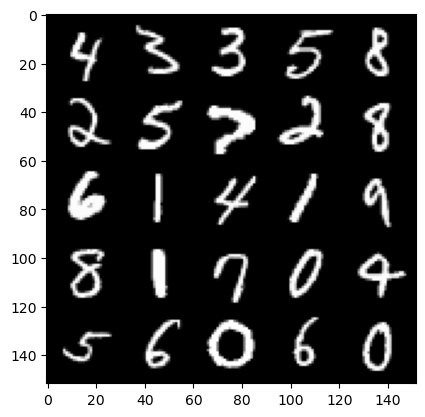

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 3.4785472440719643, discriminator loss: 0.13418313951045263


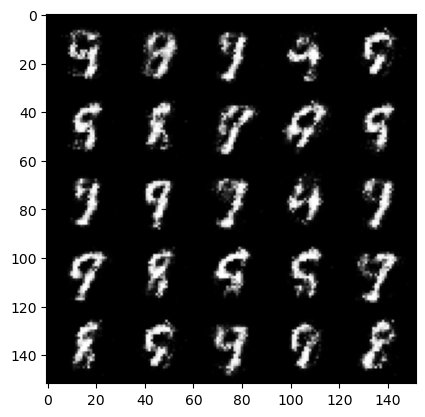

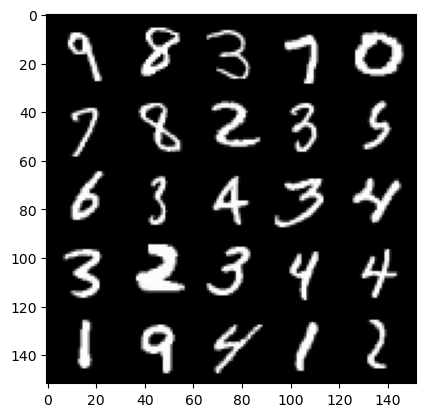

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 3.3755613412857057, discriminator loss: 0.13744943990558384


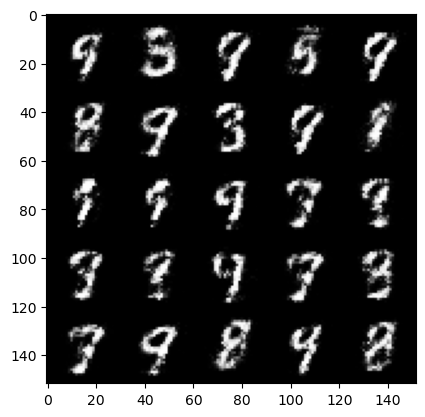

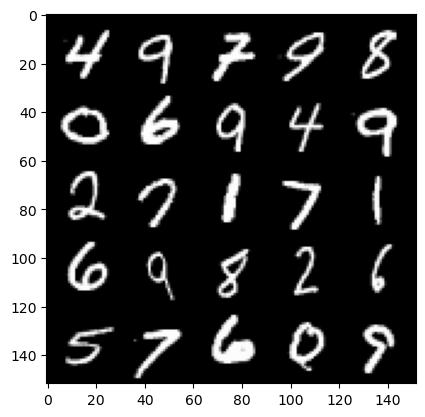

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 3.3151133337020844, discriminator loss: 0.14617268151044838


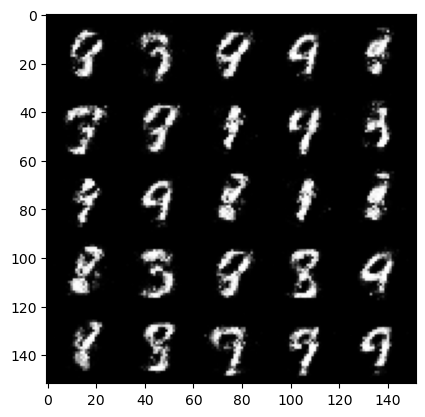

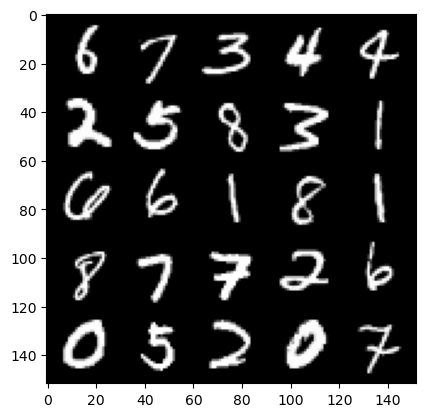

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 3.3258648777008037, discriminator loss: 0.13563417144119747


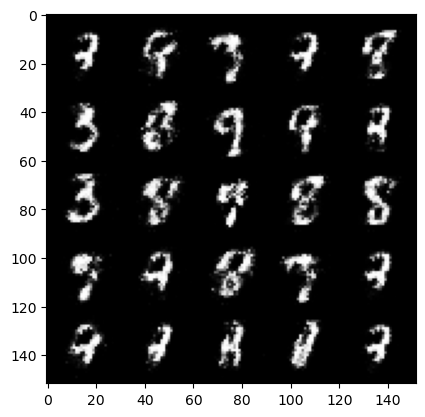

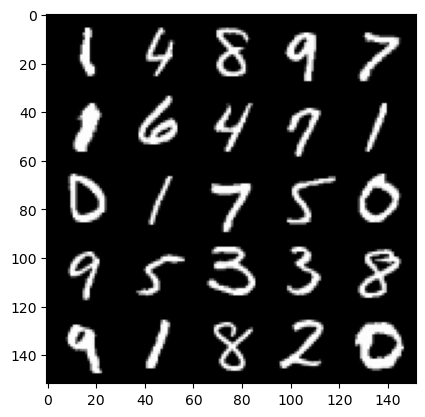

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 3.3418973488807673, discriminator loss: 0.1390904942154884


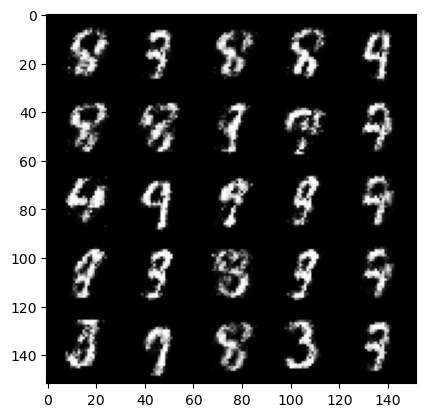

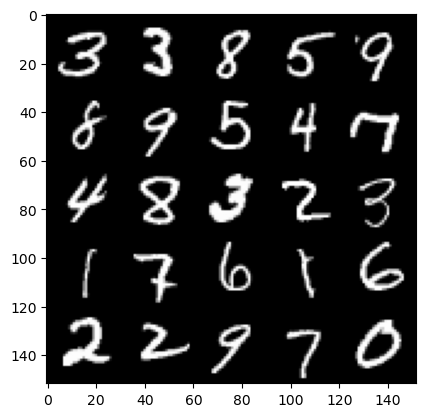

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 3.0751663980484008, discriminator loss: 0.17812367384135727


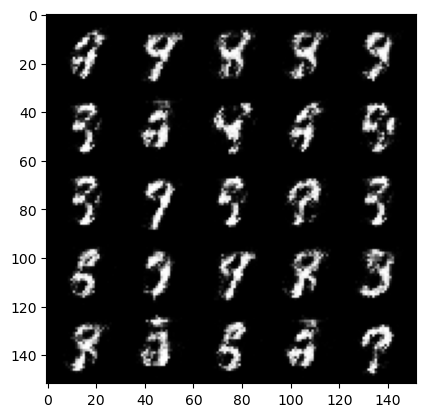

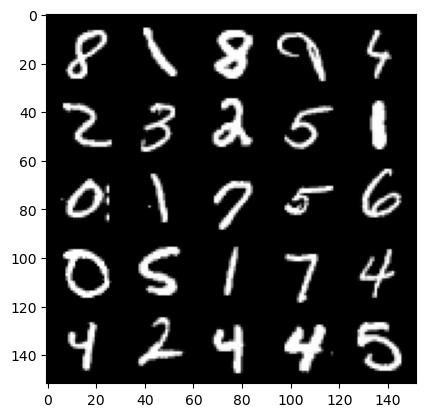

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 3.1305464944839505, discriminator loss: 0.16298484663665294


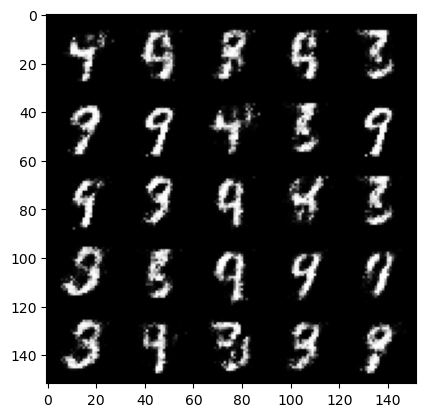

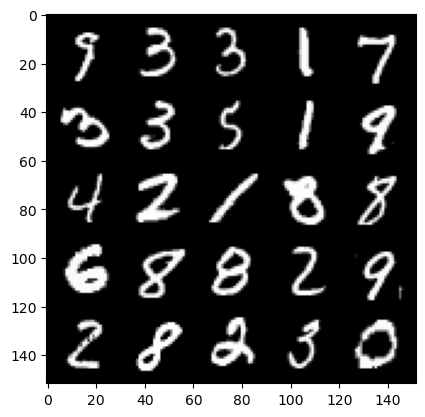

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 3.2244520850181573, discriminator loss: 0.14427852392941717


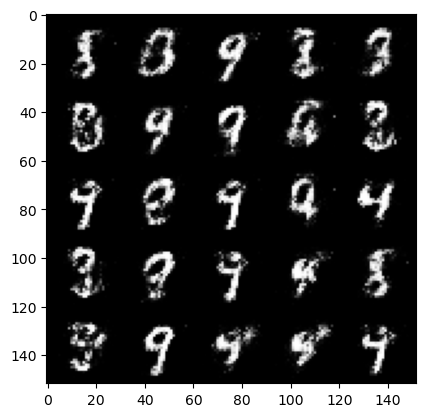

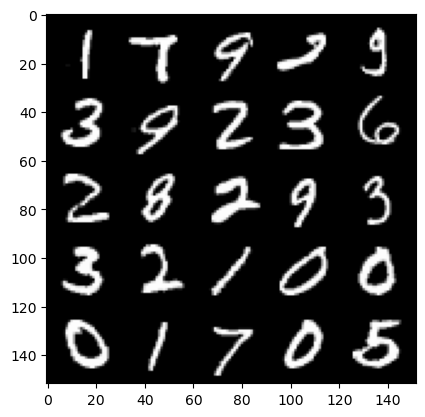

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 3.1255967483520513, discriminator loss: 0.17201183339953416


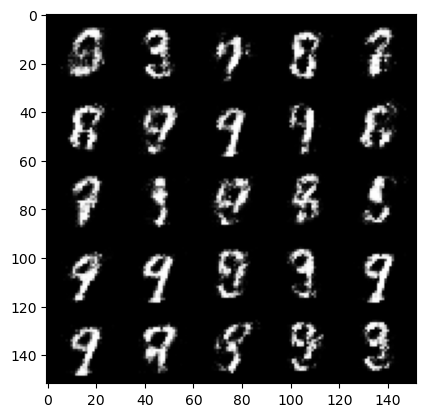

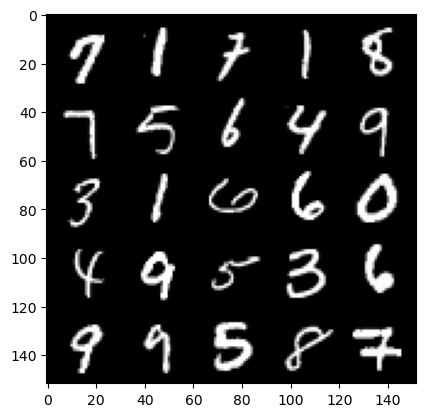

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator loss: 3.010650261878966, discriminator loss: 0.1656756757497788


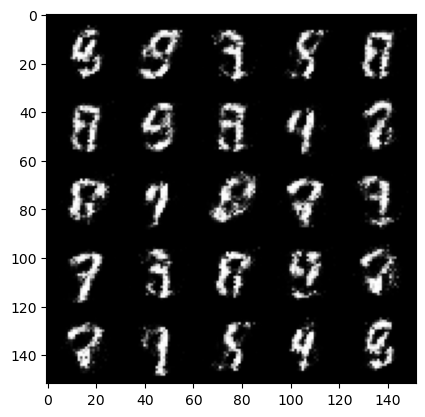

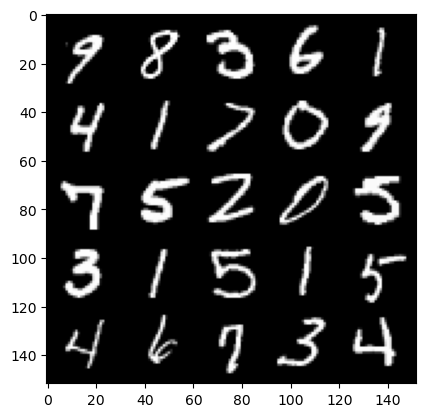

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 3.147440807819365, discriminator loss: 0.1591118212342262


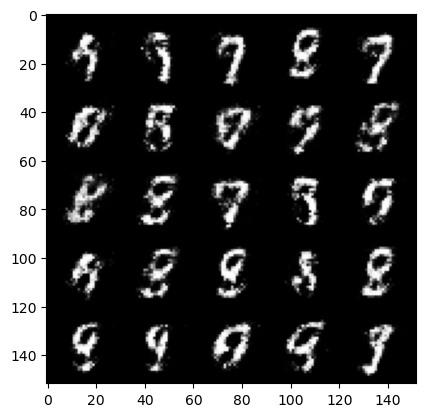

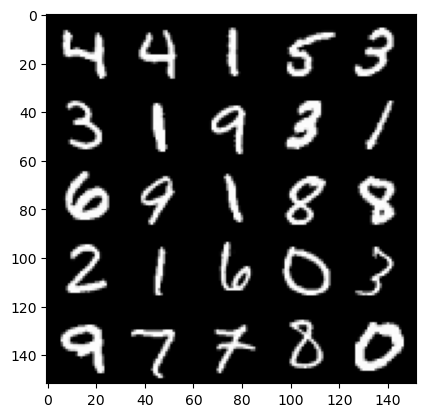

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23500: Generator loss: 3.080789829730989, discriminator loss: 0.16112643557786951


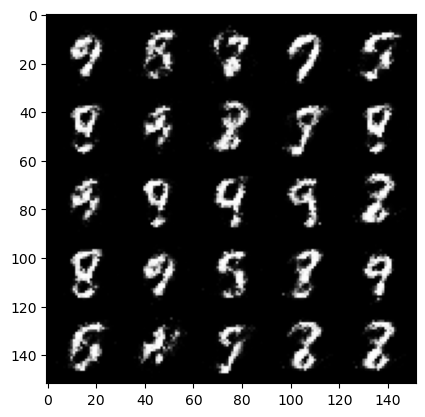

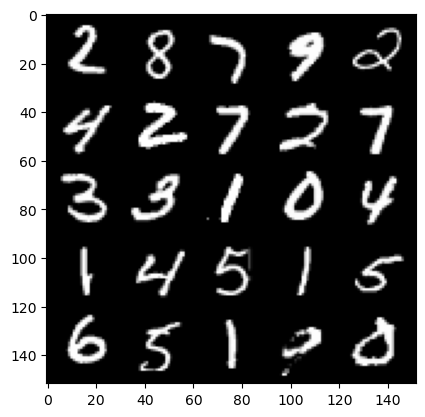

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24000: Generator loss: 3.0828459587097172, discriminator loss: 0.16456430099904532


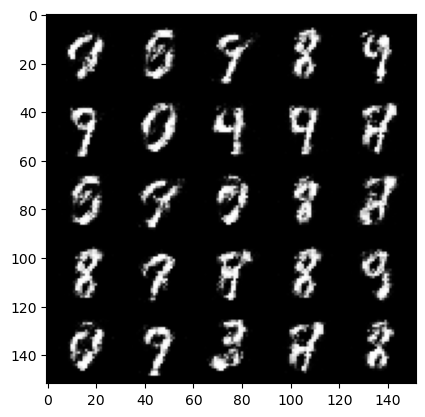

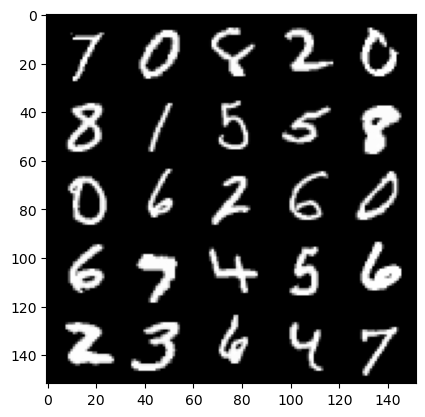

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24500: Generator loss: 2.935715071201321, discriminator loss: 0.17730708502233025


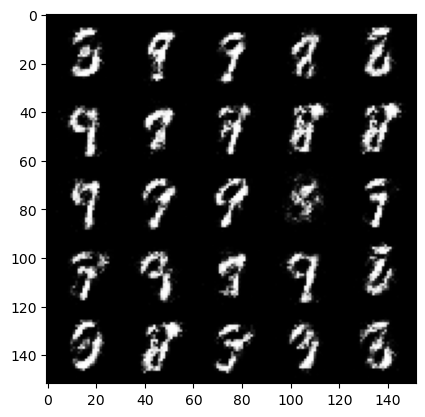

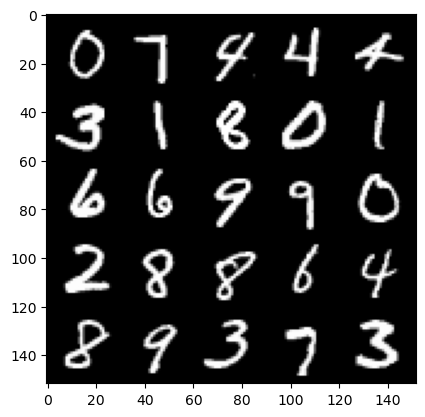

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25000: Generator loss: 2.8933967771530154, discriminator loss: 0.1887052930444479


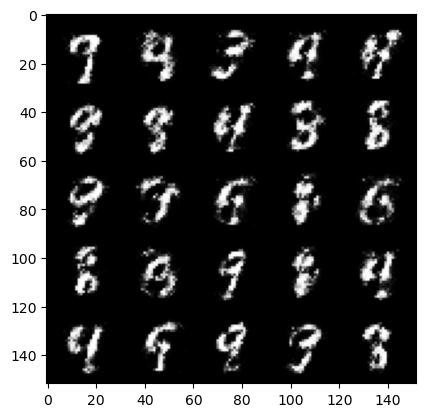

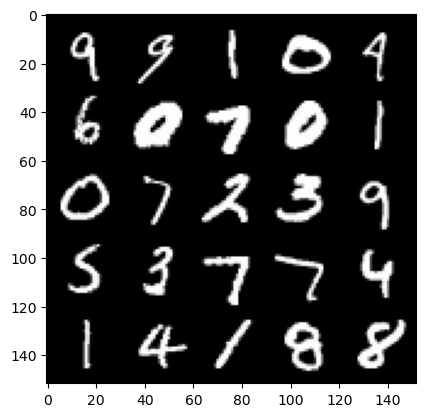

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25500: Generator loss: 2.9259676585197445, discriminator loss: 0.18820679113268857


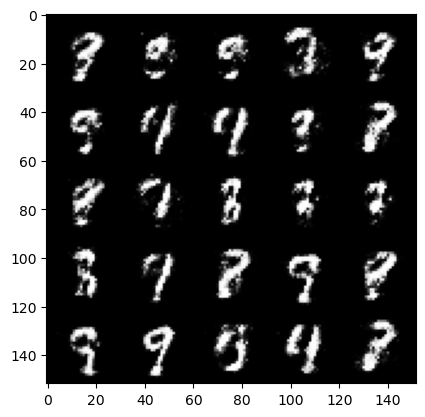

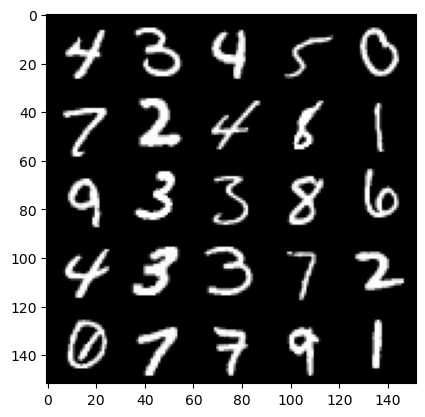

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26000: Generator loss: 2.8494196124076816, discriminator loss: 0.19398009660840052


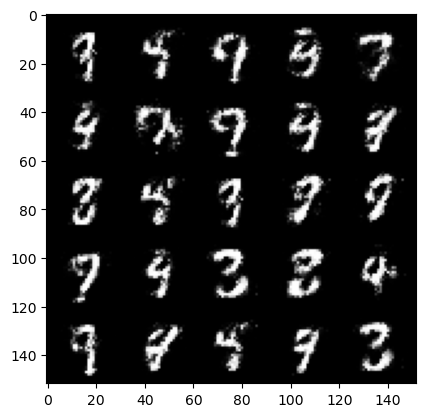

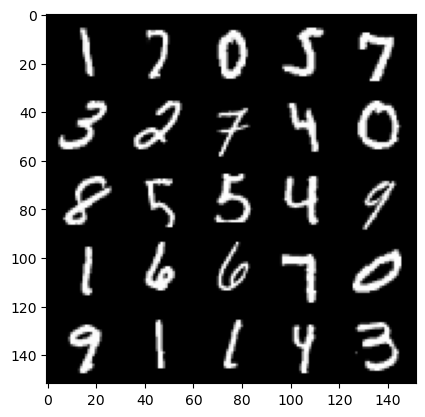

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26500: Generator loss: 2.719662083625793, discriminator loss: 0.22215083357691778


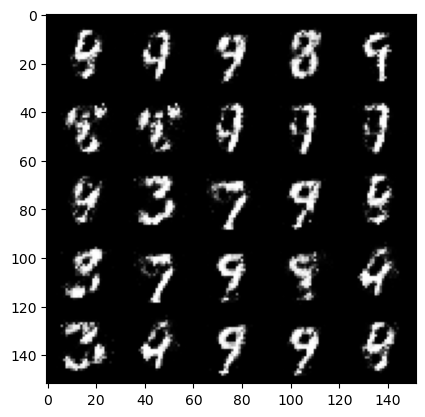

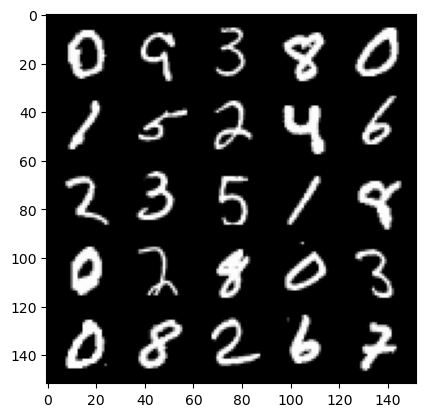

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27000: Generator loss: 2.7473440608978272, discriminator loss: 0.21371726624667658


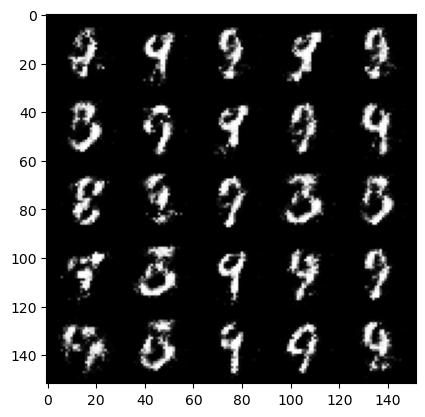

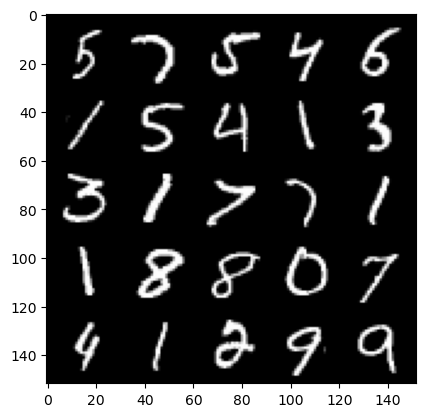

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27500: Generator loss: 2.8032551102638226, discriminator loss: 0.20154606986045828


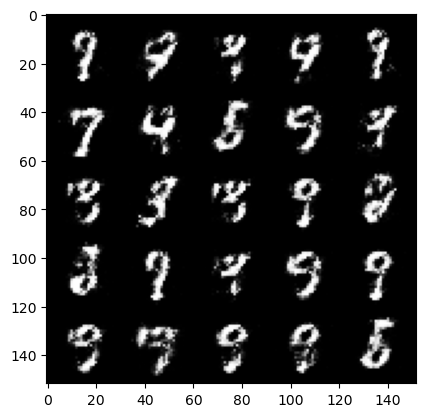

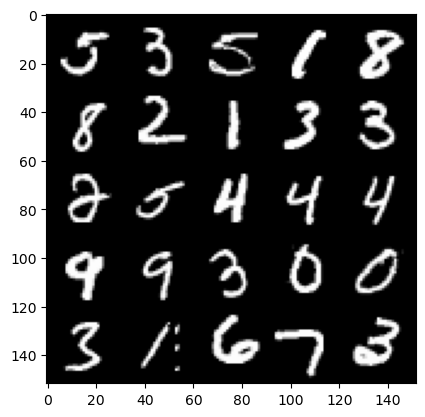

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28000: Generator loss: 2.8779173564910905, discriminator loss: 0.18071639831364153


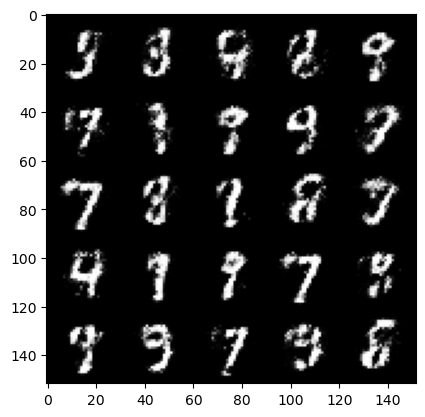

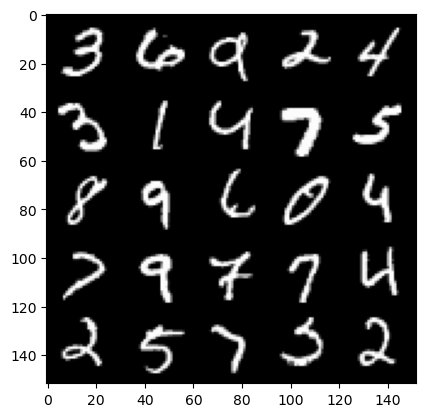

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28500: Generator loss: 2.70269068622589, discriminator loss: 0.20760311892628672


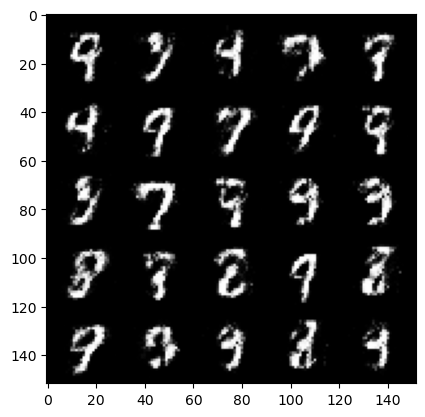

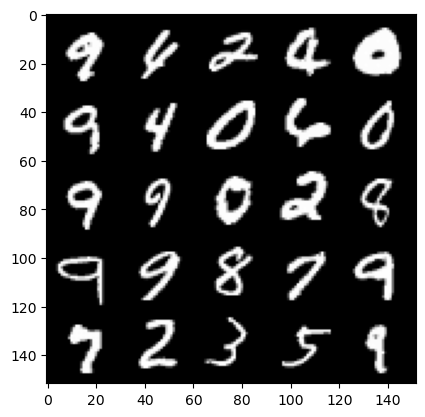

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29000: Generator loss: 2.633432796478273, discriminator loss: 0.21797911930084216


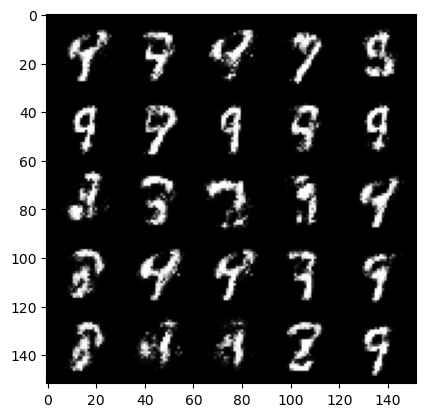

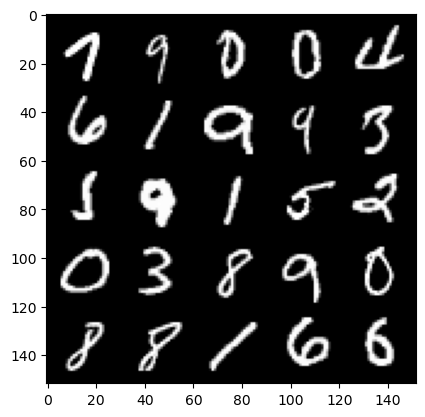

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29500: Generator loss: 2.4166330652236923, discriminator loss: 0.24681232887506488


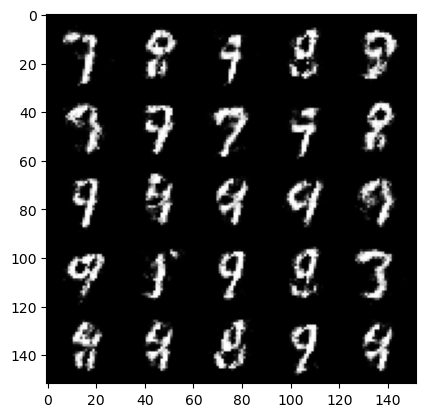

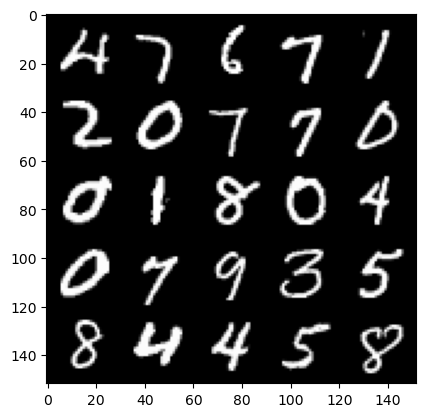

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30000: Generator loss: 2.5358232531547547, discriminator loss: 0.22113848757743845


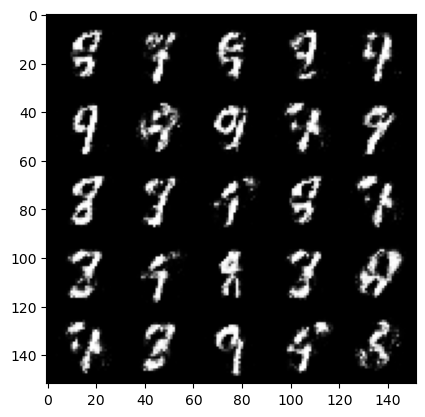

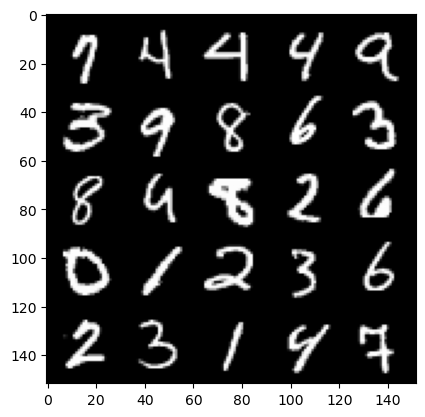

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30500: Generator loss: 2.4894695172309893, discriminator loss: 0.2387426375746727


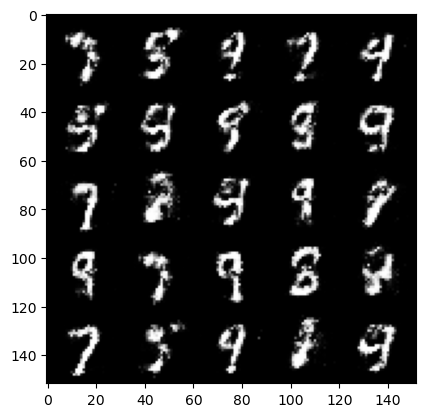

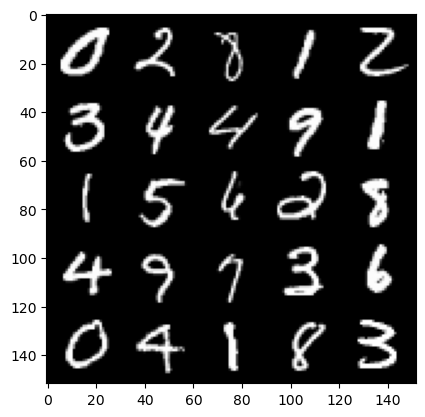

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31000: Generator loss: 2.4939502015113826, discriminator loss: 0.24398359280824686


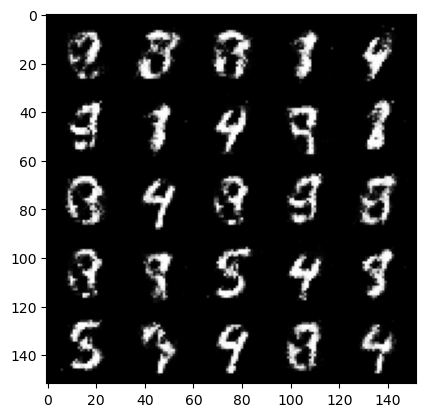

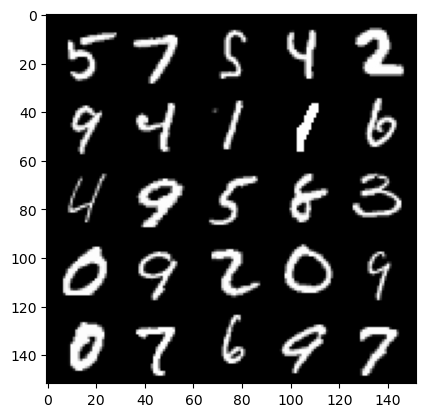

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31500: Generator loss: 2.458121149539951, discriminator loss: 0.24885486513376232


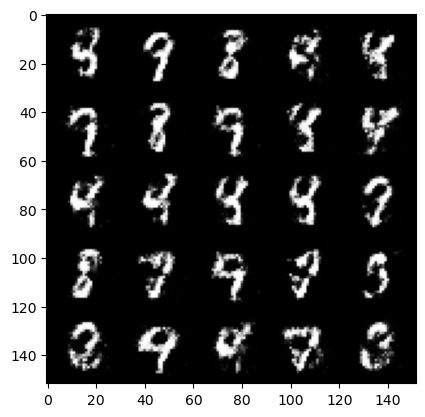

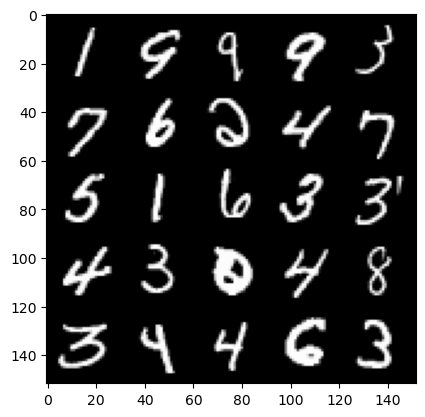

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000: Generator loss: 2.447439930915833, discriminator loss: 0.23723708996176732


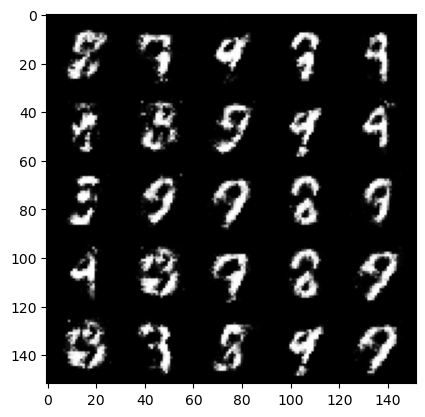

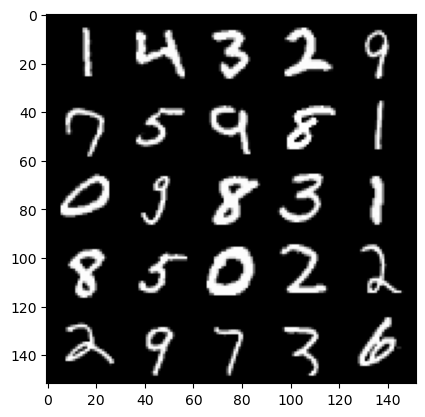

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32500: Generator loss: 2.6691484289169307, discriminator loss: 0.2046846801787614


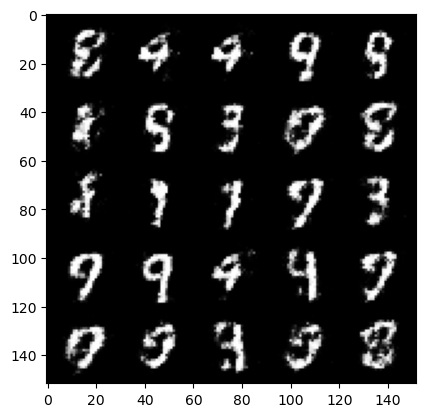

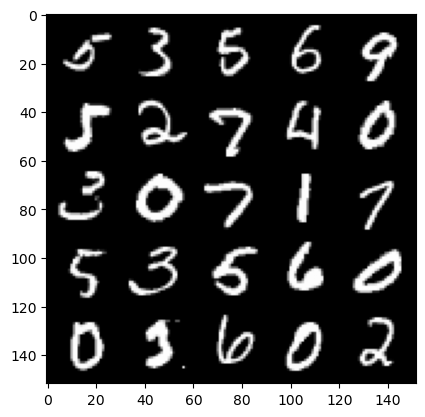

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000: Generator loss: 2.645448378086093, discriminator loss: 0.21485616236925106


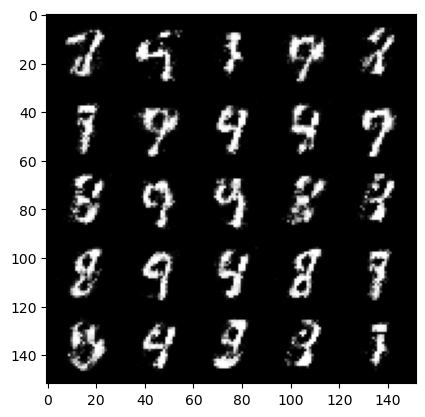

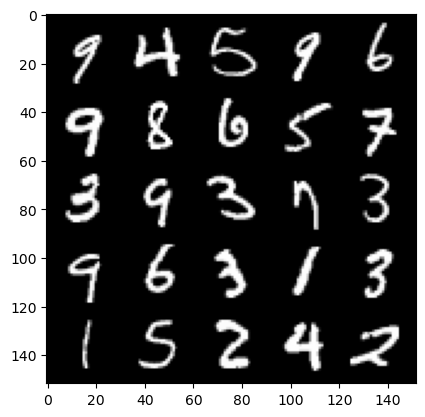

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33500: Generator loss: 2.435924592733381, discriminator loss: 0.25287226778268795


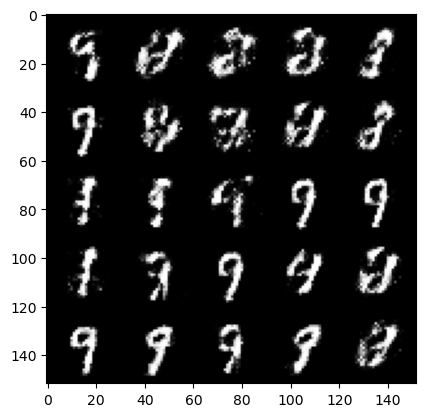

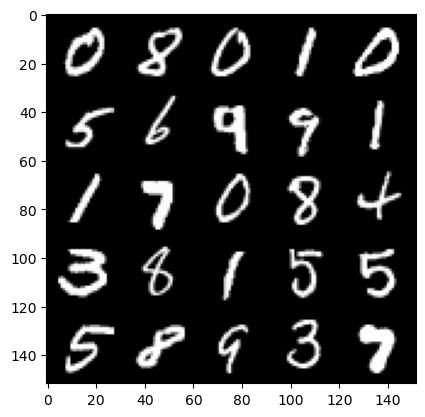

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34000: Generator loss: 2.418829410791397, discriminator loss: 0.24449586242437382


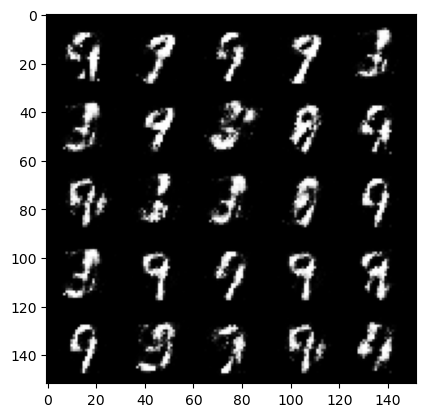

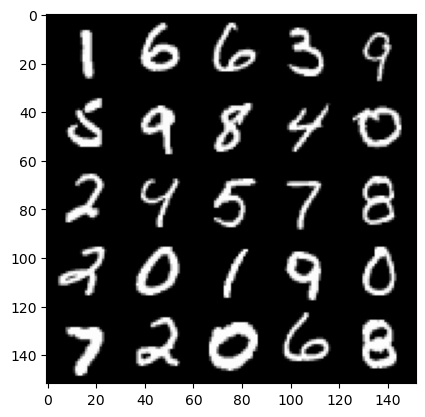

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34500: Generator loss: 2.4794047164916964, discriminator loss: 0.25496590131521246


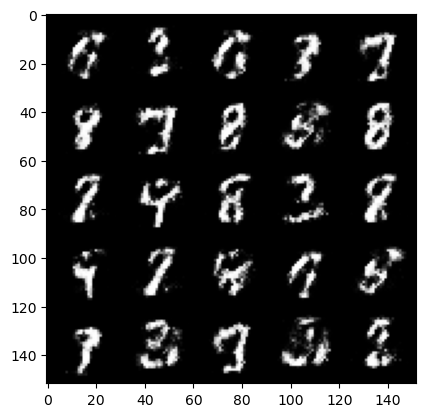

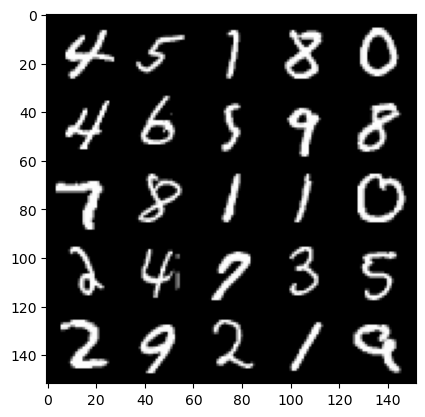

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35000: Generator loss: 2.3174222154617348, discriminator loss: 0.2718741079568864


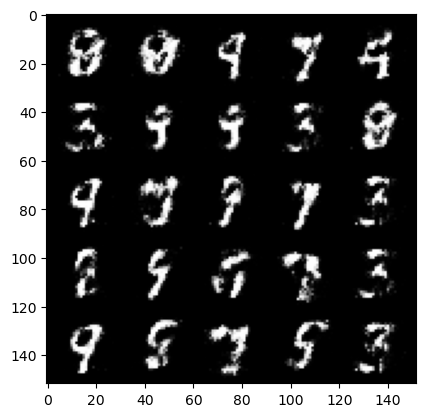

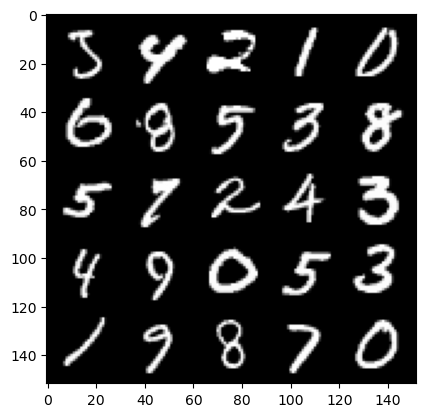

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35500: Generator loss: 2.4603971037864674, discriminator loss: 0.2365040182173251


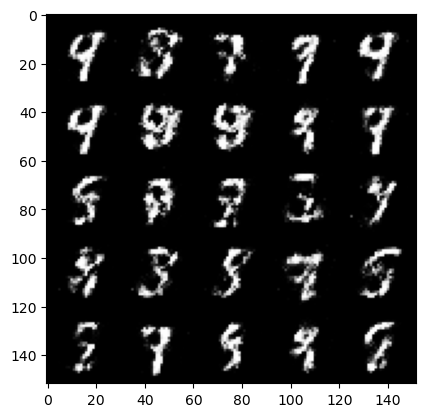

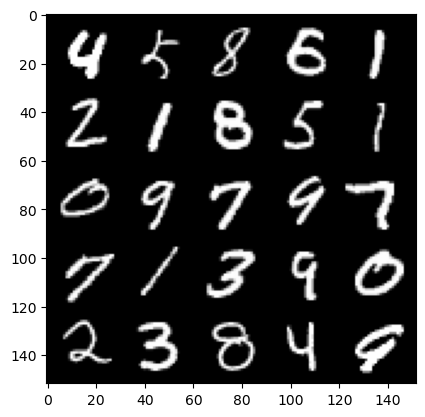

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36000: Generator loss: 2.3581213064193736, discriminator loss: 0.2710166149437425


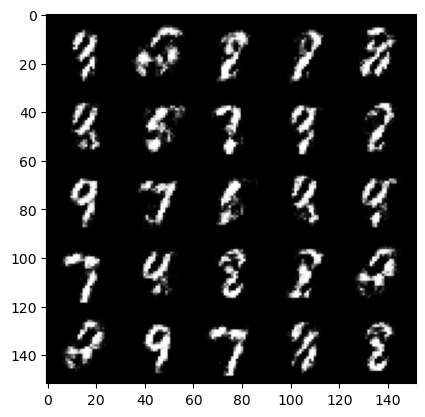

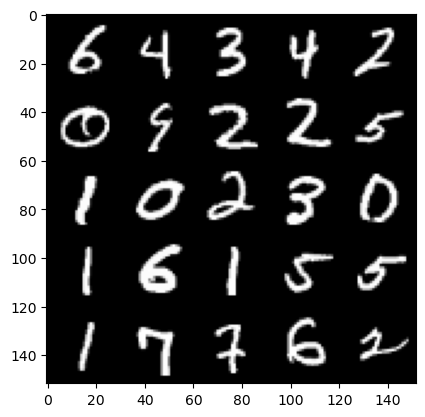

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36500: Generator loss: 2.3087126617431664, discriminator loss: 0.2728053328096867


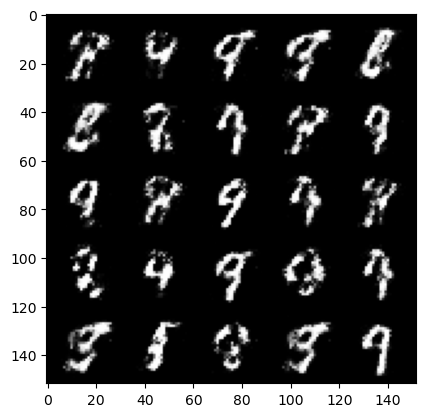

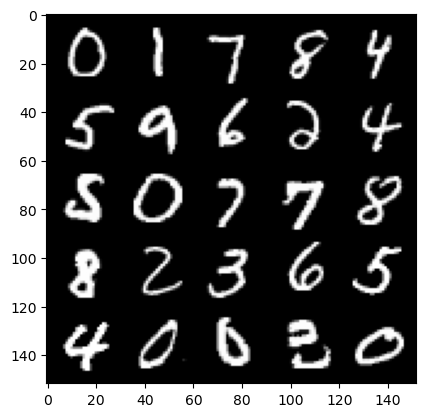

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37000: Generator loss: 2.243201892614364, discriminator loss: 0.29449549642205264


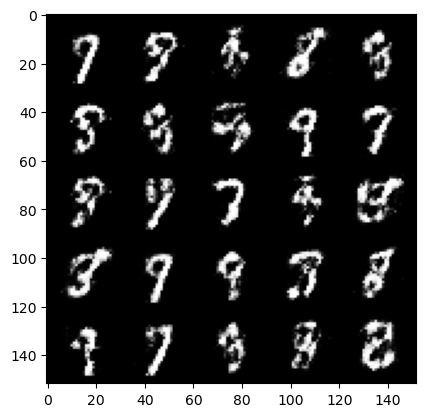

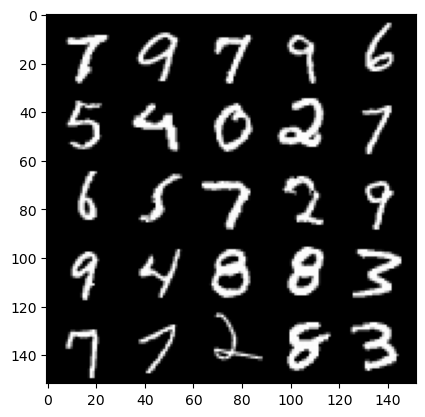

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37500: Generator loss: 2.238779300212856, discriminator loss: 0.28845854151248934


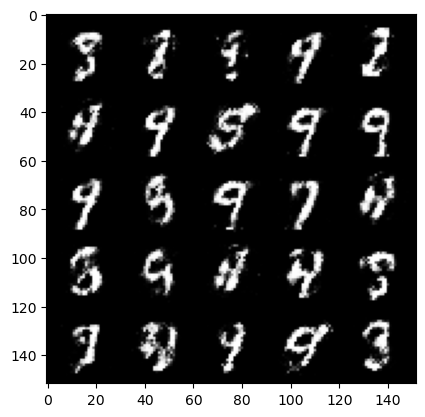

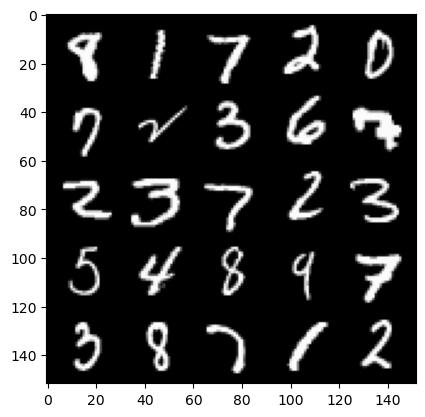

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38000: Generator loss: 2.3166485795974734, discriminator loss: 0.26780559590458863


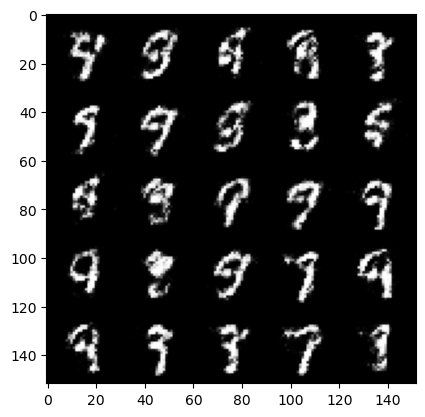

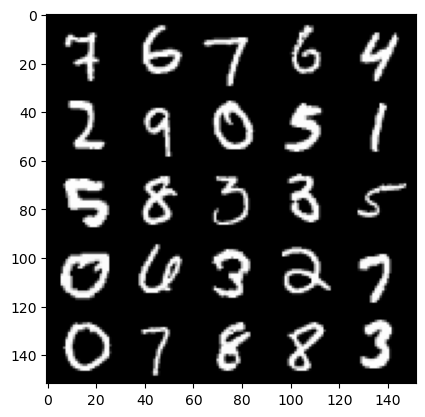

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38500: Generator loss: 2.260455214262008, discriminator loss: 0.2874349438250068


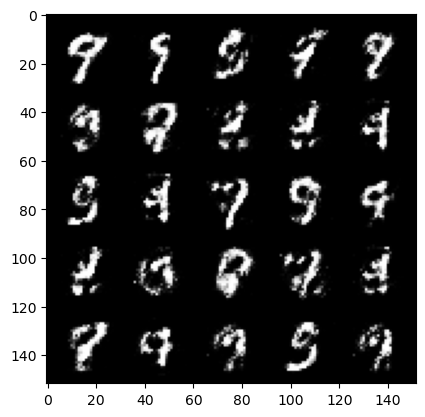

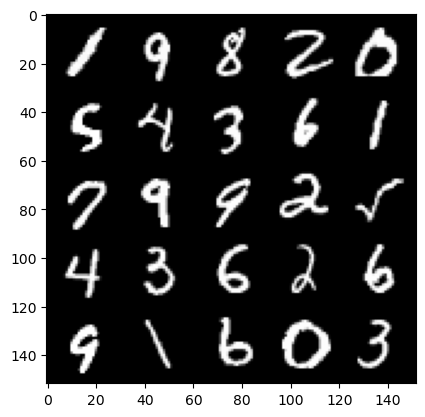

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39000: Generator loss: 2.2317509610652912, discriminator loss: 0.28561389142274857


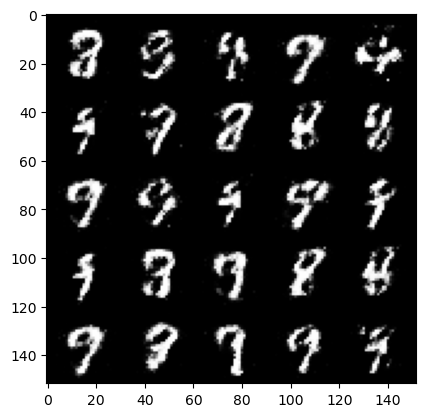

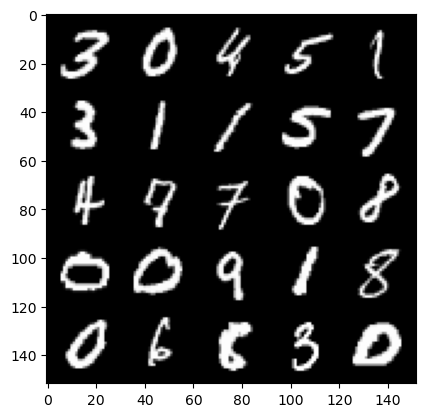

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39500: Generator loss: 2.2648899977207213, discriminator loss: 0.2725542815923693


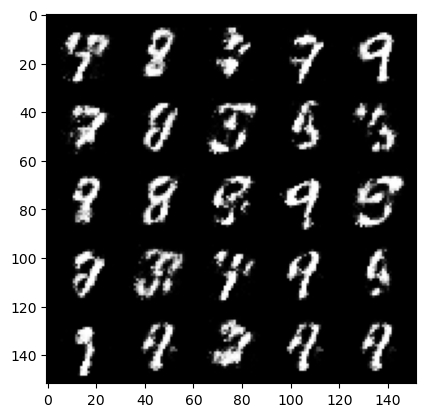

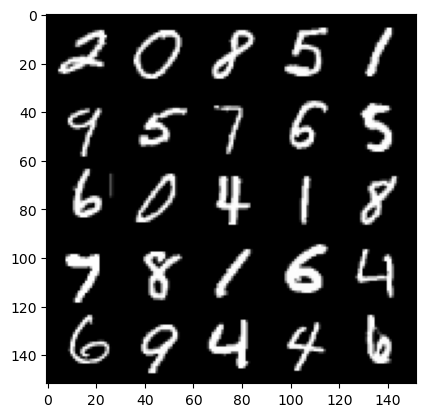

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40000: Generator loss: 2.2255911769866956, discriminator loss: 0.2856969409585


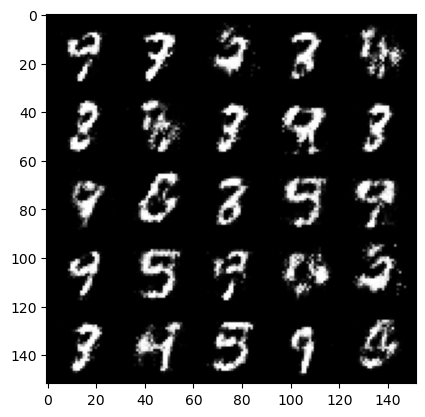

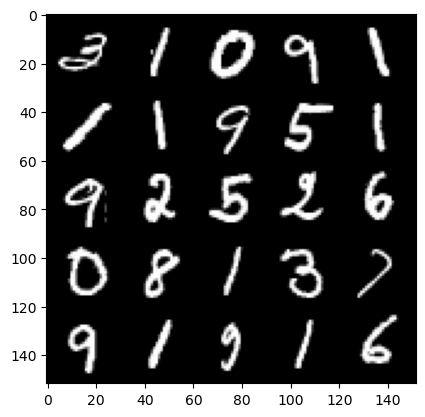

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40500: Generator loss: 2.1874598345756517, discriminator loss: 0.2926596190631391


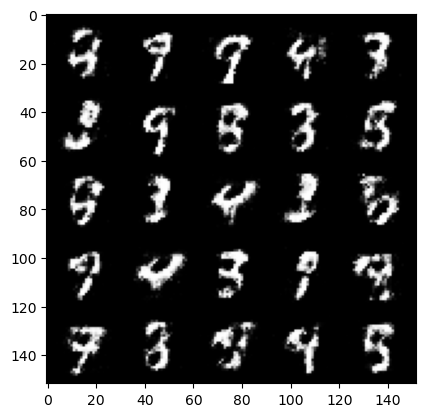

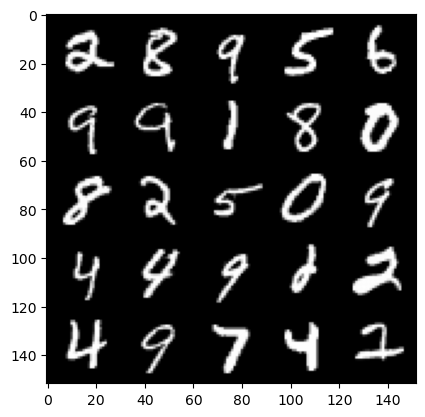

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41000: Generator loss: 2.2806624021530157, discriminator loss: 0.2670352757275106


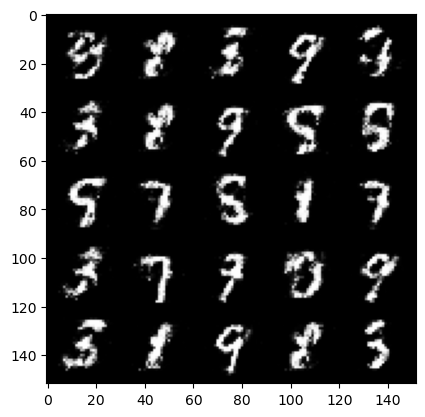

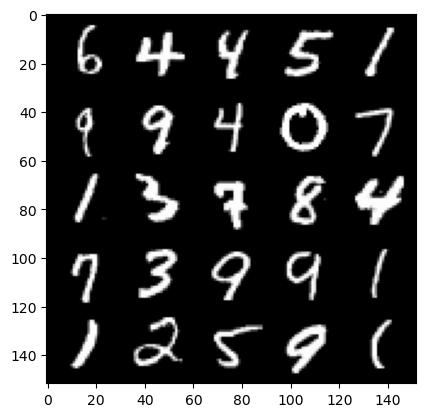

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41500: Generator loss: 2.236485563755035, discriminator loss: 0.2857275806367399


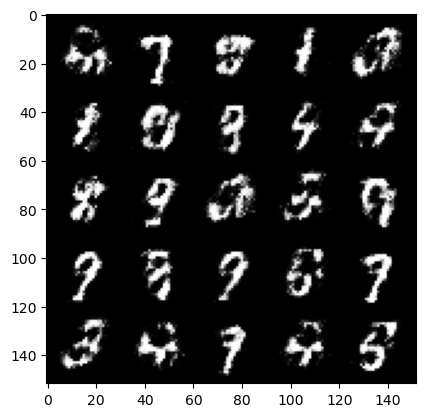

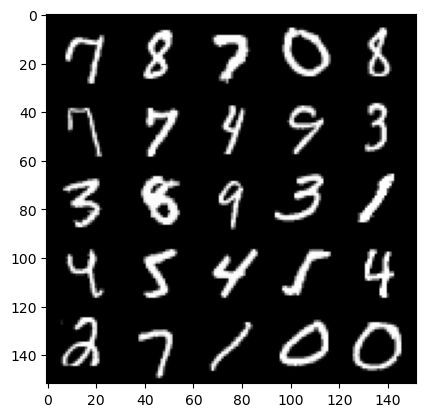

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42000: Generator loss: 2.136695202112198, discriminator loss: 0.2999928304851055


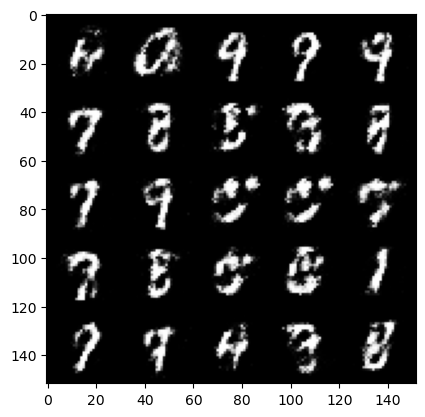

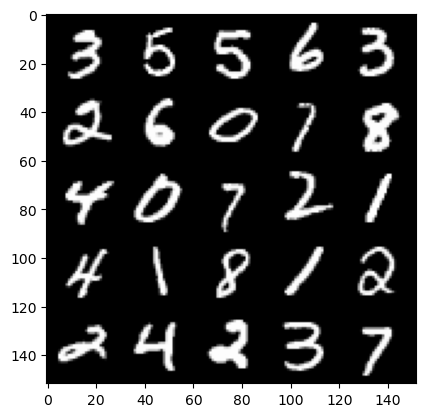

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42500: Generator loss: 2.035330704927444, discriminator loss: 0.3099367791116237


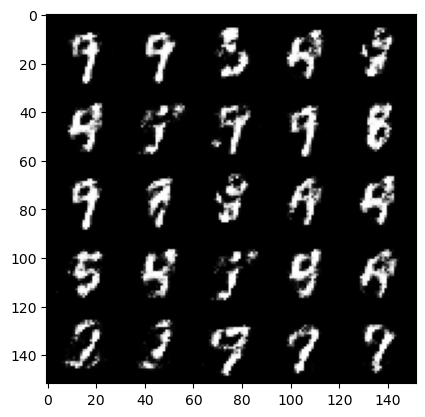

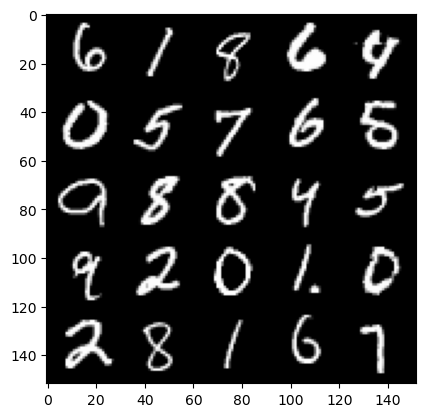

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43000: Generator loss: 2.248565050840379, discriminator loss: 0.26242596238851573


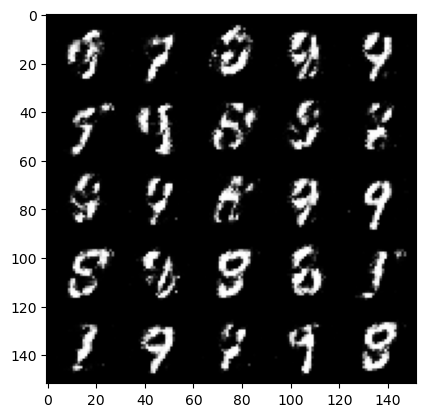

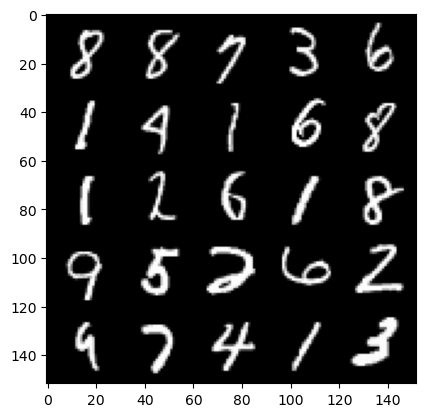

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43500: Generator loss: 2.1085656585693373, discriminator loss: 0.2985353735089301


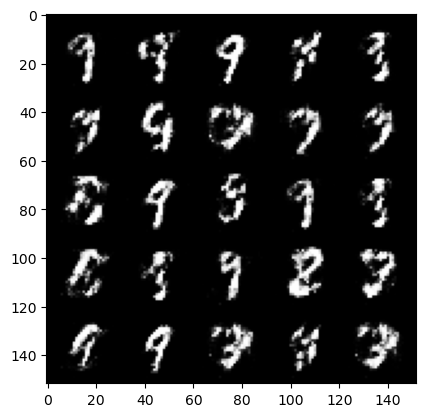

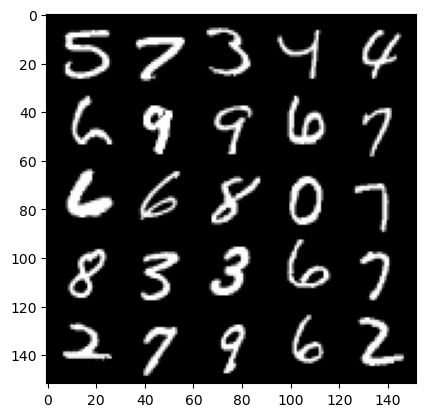

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44000: Generator loss: 2.053241398334503, discriminator loss: 0.3063874166309835


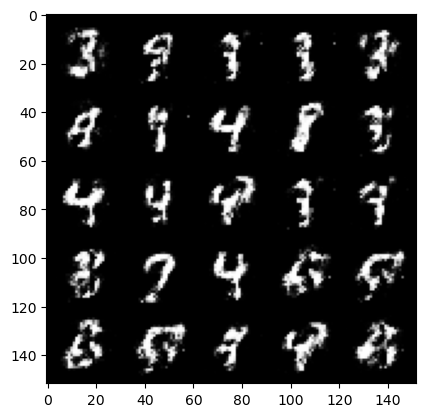

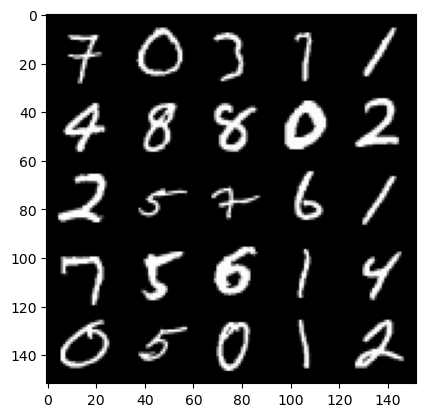

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44500: Generator loss: 2.1468159182071695, discriminator loss: 0.3009113177955151


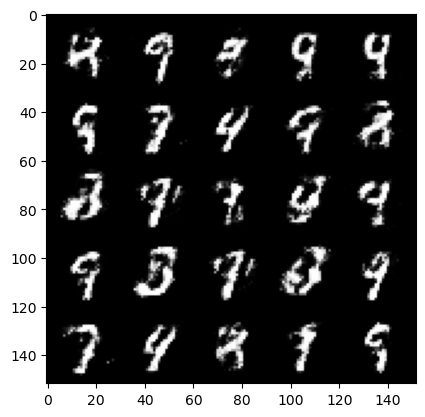

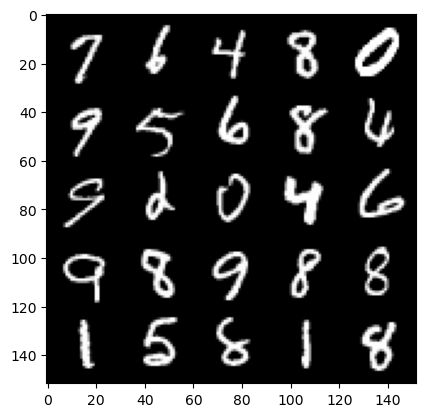

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45000: Generator loss: 2.113341511011121, discriminator loss: 0.30019095227122305


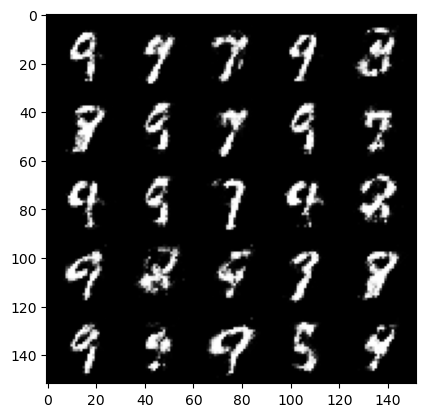

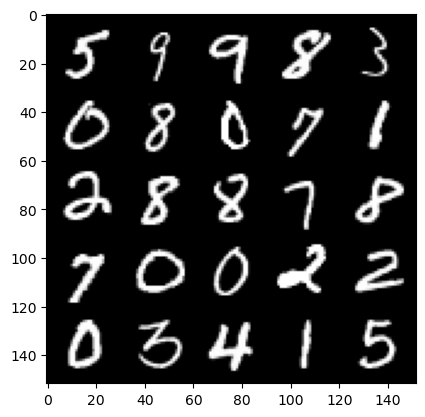

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45500: Generator loss: 2.0555814452171317, discriminator loss: 0.31413004711270337


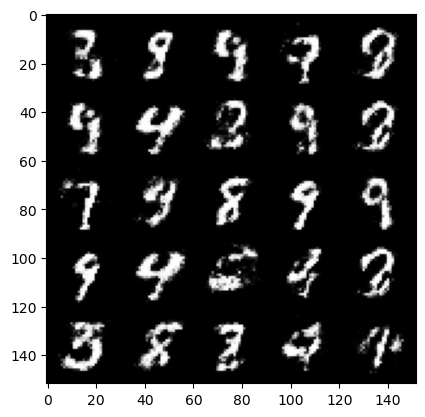

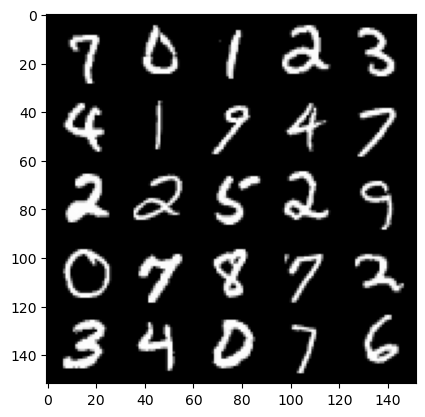

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46000: Generator loss: 2.076211474657059, discriminator loss: 0.3026076269447804


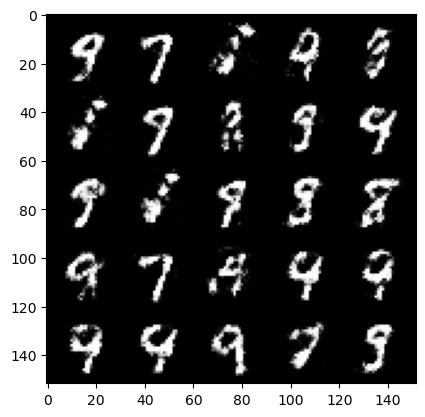

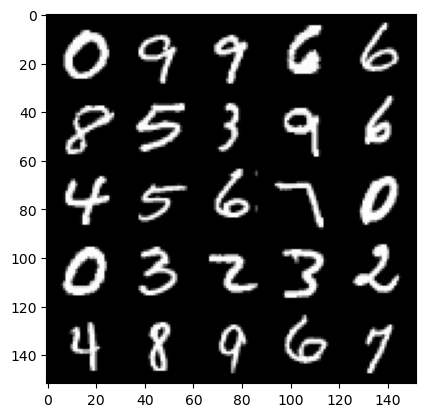

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46500: Generator loss: 2.012013797998429, discriminator loss: 0.33245874536037434


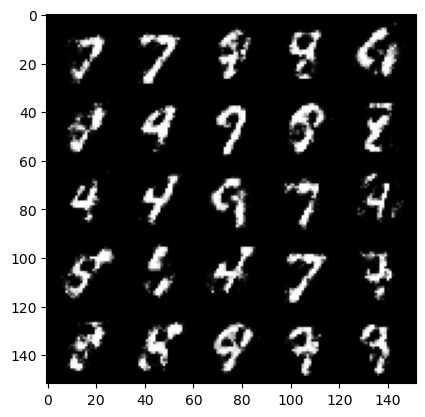

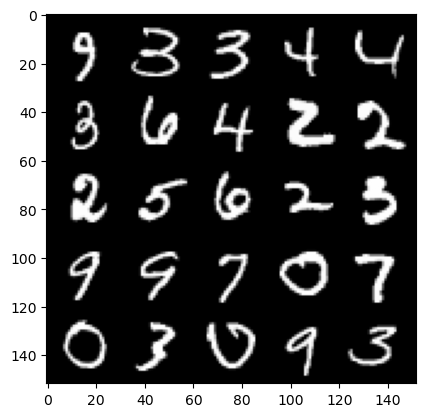

In [23]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen,disc,criterion,cur_batch_size, z_dim, device)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1


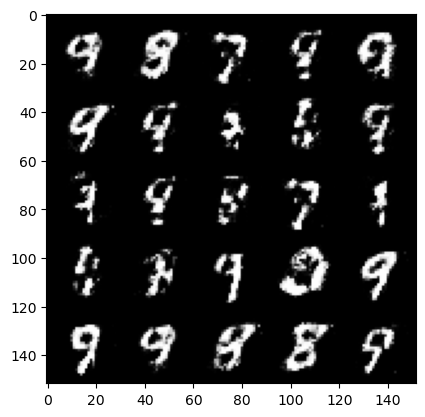

In [26]:
fake_noise = get_noise(25, z_dim, device=device)
fake = gen(fake_noise)
show_tensor_images(fake)